# Trabalho de Dados e Aprendizagem Automática

## Análise dos dados

In [30]:
import sklearn as skl
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [31]:
df_train = pd.read_csv("./Dataset/training_data.csv", encoding="latin1")
df_test = pd.read_csv("./Dataset/test_data.csv", encoding="latin1")

In [32]:
print(df_train.columns)
print(df_test.columns)

Index(['city_name', 'record_date', 'AVERAGE_SPEED_DIFF',
       'AVERAGE_FREE_FLOW_SPEED', 'AVERAGE_TIME_DIFF',
       'AVERAGE_FREE_FLOW_TIME', 'LUMINOSITY', 'AVERAGE_TEMPERATURE',
       'AVERAGE_ATMOSP_PRESSURE', 'AVERAGE_HUMIDITY', 'AVERAGE_WIND_SPEED',
       'AVERAGE_CLOUDINESS', 'AVERAGE_PRECIPITATION', 'AVERAGE_RAIN'],
      dtype='object')
Index(['city_name', 'record_date', 'AVERAGE_FREE_FLOW_SPEED',
       'AVERAGE_TIME_DIFF', 'AVERAGE_FREE_FLOW_TIME', 'LUMINOSITY',
       'AVERAGE_TEMPERATURE', 'AVERAGE_ATMOSP_PRESSURE', 'AVERAGE_HUMIDITY',
       'AVERAGE_WIND_SPEED', 'AVERAGE_CLOUDINESS', 'AVERAGE_PRECIPITATION',
       'AVERAGE_RAIN'],
      dtype='object')


In [33]:
df_train.head()

,city_name,record_date,AVERAGE_SPEED_DIFF,AVERAGE_FREE_FLOW_SPEED,AVERAGE_TIME_DIFF,AVERAGE_FREE_FLOW_TIME,LUMINOSITY,AVERAGE_TEMPERATURE,AVERAGE_ATMOSP_PRESSURE,AVERAGE_HUMIDITY,AVERAGE_WIND_SPEED,AVERAGE_CLOUDINESS,AVERAGE_PRECIPITATION,AVERAGE_RAIN
0,Porto,2019-08-29 07:00:00,Medium,41.5,11.5,71.4,LIGHT,15.0,1019.0,100.0,3.0,NaN,0.0,NaN
1,Porto,2018-08-10 14:00:00,High,41.7,48.3,87.4,LIGHT,21.0,1021.0,53.0,5.0,céu claro,0.0,NaN
2,Porto,2019-09-01 16:00:00,High,38.6,38.4,85.2,LIGHT,26.0,1014.0,61.0,4.0,NaN,0.0,NaN
3,Porto,2019-02-26 11:00:00,High,37.4,61.0,94.1,LIGHT,18.0,1025.0,48.0,4.0,céu claro,0.0,NaN
4,Porto,2019-06-06 12:00:00,Medium,41.6,50.4,77.0,LIGHT,15.0,1008.0,82.0,10.0,NaN,0.0,NaN


In [34]:
df_test.head()

,city_name,record_date,AVERAGE_FREE_FLOW_SPEED,AVERAGE_TIME_DIFF,AVERAGE_FREE_FLOW_TIME,LUMINOSITY,AVERAGE_TEMPERATURE,AVERAGE_ATMOSP_PRESSURE,AVERAGE_HUMIDITY,AVERAGE_WIND_SPEED,AVERAGE_CLOUDINESS,AVERAGE_PRECIPITATION,AVERAGE_RAIN
0,Porto,2019-02-13 23:00:00,39.2,0.0,91.0,DARK,8.0,1026.0,71.0,1.0,céu claro,0.0,NaN
1,Porto,2018-11-28 20:00:00,42.5,12.2,76.8,DARK,11.0,1020.0,93.0,4.0,nuvens dispersas,0.0,NaN
2,Porto,2018-08-14 05:00:00,45.9,0.0,86.3,DARK,14.0,1017.0,93.0,0.0,NaN,0.0,NaN
3,Porto,2019-07-06 17:00:00,33.2,51.7,89.9,LIGHT,22.0,1016.0,77.0,4.0,céu pouco nublado,0.0,NaN
4,Porto,2018-10-15 06:00:00,44.0,3.5,85.5,DARK,12.0,1004.0,100.0,9.0,NaN,0.0,chuva fraca


In [35]:
df_train.tail()

,city_name,record_date,AVERAGE_SPEED_DIFF,AVERAGE_FREE_FLOW_SPEED,AVERAGE_TIME_DIFF,AVERAGE_FREE_FLOW_TIME,LUMINOSITY,AVERAGE_TEMPERATURE,AVERAGE_ATMOSP_PRESSURE,AVERAGE_HUMIDITY,AVERAGE_WIND_SPEED,AVERAGE_CLOUDINESS,AVERAGE_PRECIPITATION,AVERAGE_RAIN
6807,Porto,2019-02-23 09:00:00,Low,41.2,3.7,86.9,LIGHT,9.0,1030.0,71.0,4.0,céu claro,0.0,NaN
6808,Porto,2019-06-08 18:00:00,Medium,38.9,51.9,76.9,LIGHT,17.0,1020.0,63.0,6.0,NaN,0.0,NaN
6809,Porto,2018-10-02 04:00:00,NaN,39.6,0.0,89.1,DARK,15.0,1020.0,39.0,4.0,céu claro,0.0,NaN
6810,Porto,2019-01-30 01:00:00,NaN,41.6,0.0,85.5,DARK,8.0,1018.0,81.0,1.0,algumas nuvens,0.0,NaN
6811,Porto,2019-06-15 21:00:00,Medium,41.7,32.9,78.1,DARK,15.0,1021.0,72.0,4.0,NaN,0.0,NaN


In [36]:
df_test.tail()

,city_name,record_date,AVERAGE_FREE_FLOW_SPEED,AVERAGE_TIME_DIFF,AVERAGE_FREE_FLOW_TIME,LUMINOSITY,AVERAGE_TEMPERATURE,AVERAGE_ATMOSP_PRESSURE,AVERAGE_HUMIDITY,AVERAGE_WIND_SPEED,AVERAGE_CLOUDINESS,AVERAGE_PRECIPITATION,AVERAGE_RAIN
1495,Porto,2018-11-24 05:00:00,50.2,1.1,80.5,DARK,11.0,1013.0,100.0,5.0,NaN,0.0,chuva fraca
1496,Porto,2019-03-01 02:00:00,38.0,4.6,85.6,DARK,9.0,1028.0,100.0,0.0,NaN,0.0,NaN
1497,Porto,2018-09-05 01:00:00,43.8,0.0,80.4,DARK,16.0,1013.0,100.0,1.0,NaN,0.0,NaN
1498,Porto,2018-11-05 08:00:00,46.0,83.2,83.2,LIGHT,10.0,1004.0,87.0,5.0,NaN,0.0,chuva moderada
1499,Porto,2019-08-18 13:00:00,41.7,15.9,93.0,LIGHT,21.0,1016.0,82.0,7.0,nuvens quebradas,0.0,NaN


In [37]:
print(df_train.shape)
print(df_test.shape)

(6812, 14)
(1500, 13)


In [38]:
print(df_train.dtypes)
print(df_test.dtypes)

city_name                   object
record_date                 object
AVERAGE_SPEED_DIFF          object
AVERAGE_FREE_FLOW_SPEED    float64
AVERAGE_TIME_DIFF          float64
AVERAGE_FREE_FLOW_TIME     float64
LUMINOSITY                  object
AVERAGE_TEMPERATURE        float64
AVERAGE_ATMOSP_PRESSURE    float64
AVERAGE_HUMIDITY           float64
AVERAGE_WIND_SPEED         float64
AVERAGE_CLOUDINESS          object
AVERAGE_PRECIPITATION      float64
AVERAGE_RAIN                object
dtype: object
city_name                   object
record_date                 object
AVERAGE_FREE_FLOW_SPEED    float64
AVERAGE_TIME_DIFF          float64
AVERAGE_FREE_FLOW_TIME     float64
LUMINOSITY                  object
AVERAGE_TEMPERATURE        float64
AVERAGE_ATMOSP_PRESSURE    float64
AVERAGE_HUMIDITY           float64
AVERAGE_WIND_SPEED         float64
AVERAGE_CLOUDINESS          object
AVERAGE_PRECIPITATION      float64
AVERAGE_RAIN                object
dtype: object


In [39]:
print("\n--- ESTATÍSTICAS DESCRITIVAS (Numéricas) ---")
# Transpose (.T) facilita a leitura no relatório
display(df_train.describe().T) 

print("\n--- ESTATÍSTICAS (Categóricas) ---")
display(df_train.describe(include=['O']).T)

print("\n--- ESTATÍSTICAS DESCRITIVAS (Numéricas) ---")
# Transpose (.T) facilita a leitura no relatório
display(df_test.describe().T) 

print("\n--- ESTATÍSTICAS (Categóricas) ---")
display(df_test.describe(include=['O']).T)


--- ESTATÍSTICAS DESCRITIVAS (Numéricas) ---


,count,mean,std,min,25%,50%,75%,max
AVERAGE_FREE_FLOW_SPEED,6812.0,40.661010,4.119023,30.5,37.600,40.7,43.5,55.9
AVERAGE_TIME_DIFF,6812.0,25.637111,33.510507,0.0,2.275,12.2,36.2,296.5
AVERAGE_FREE_FLOW_TIME,6812.0,81.143952,8.294401,46.4,75.400,82.4,87.4,112.0
AVERAGE_TEMPERATURE,6812.0,16.193482,5.163492,0.0,13.000,16.0,19.0,35.0
AVERAGE_ATMOSP_PRESSURE,6812.0,1017.388139,5.751061,985.0,1015.000,1017.0,1021.0,1033.0
AVERAGE_HUMIDITY,6812.0,80.084190,18.238863,14.0,69.750,83.0,93.0,100.0
AVERAGE_WIND_SPEED,6812.0,3.058573,2.138421,0.0,1.000,3.0,4.0,14.0
AVERAGE_PRECIPITATION,6812.0,0.000000,0.000000,0.0,0.000,0.0,0.0,0.0



--- ESTATÍSTICAS (Categóricas) ---


,count,unique,top,freq
city_name,6812,1,Porto,6812
record_date,6812,6812,2019-08-29 07:00:00,1
AVERAGE_SPEED_DIFF,4612,4,Medium,1651
LUMINOSITY,6812,3,LIGHT,3293
AVERAGE_CLOUDINESS,4130,9,céu claro,1582
AVERAGE_RAIN,563,13,chuva fraca,261



--- ESTATÍSTICAS DESCRITIVAS (Numéricas) ---


,count,mean,std,min,25%,50%,75%,max
AVERAGE_FREE_FLOW_SPEED,1500.0,40.830400,4.239600,31.0,37.5,41.0,43.900,56.2
AVERAGE_TIME_DIFF,1500.0,26.750533,34.089866,0.0,2.5,12.6,40.225,232.3
AVERAGE_FREE_FLOW_TIME,1500.0,81.194333,8.189691,48.1,75.8,82.3,87.600,106.1
AVERAGE_TEMPERATURE,1500.0,16.104000,5.094293,1.0,13.0,16.0,19.000,32.0
AVERAGE_ATMOSP_PRESSURE,1500.0,1017.457333,5.840455,985.0,1015.0,1018.0,1021.000,1033.0
AVERAGE_HUMIDITY,1500.0,80.734000,17.729358,14.0,72.0,86.0,93.000,100.0
AVERAGE_WIND_SPEED,1500.0,3.116667,2.198699,0.0,1.0,3.0,4.000,13.0
AVERAGE_PRECIPITATION,1500.0,0.000000,0.000000,0.0,0.0,0.0,0.000,0.0



--- ESTATÍSTICAS (Categóricas) ---


,count,unique,top,freq
city_name,1500,1,Porto,1500
record_date,1500,1500,2019-02-13 23:00:00,1
LUMINOSITY,1500,3,DARK,730
AVERAGE_CLOUDINESS,901,9,céu claro,345
AVERAGE_RAIN,140,9,chuva fraca,68


C:\Users\dirod\AppData\Local\Temp\ipykernel_23244\1085519249.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(data=df_train, x='AVERAGE_SPEED_DIFF', order=target_order, palette="magma")


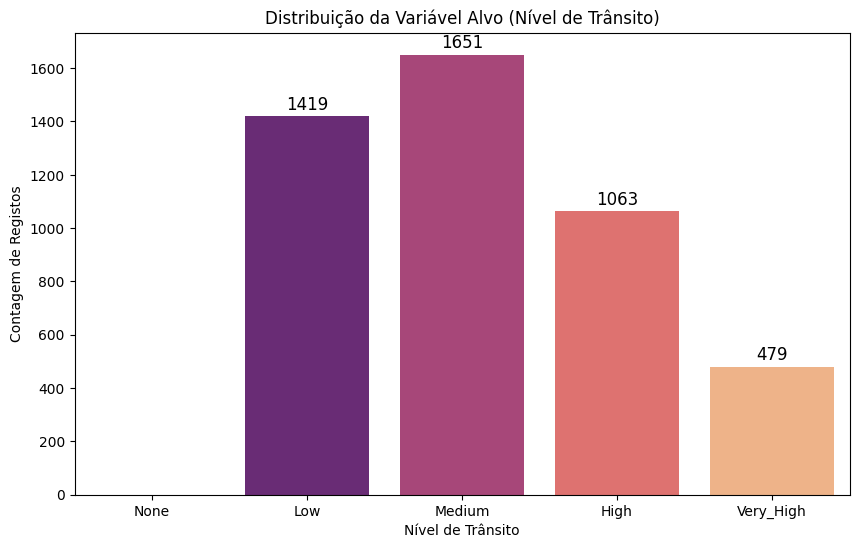

In [40]:
target_order = ['None', 'Low', 'Medium', 'High', 'Very_High']

plt.figure(figsize=(10, 6))
ax = sns.countplot(data=df_train, x='AVERAGE_SPEED_DIFF', order=target_order, palette="magma")

plt.title('Distribuição da Variável Alvo (Nível de Trânsito)')
plt.xlabel('Nível de Trânsito')
plt.ylabel('Contagem de Registos')

# Adicionar as contagens em cima das barras
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='baseline', fontsize=12, color='black', xytext=(0, 5), 
                textcoords='offset points')
plt.show()

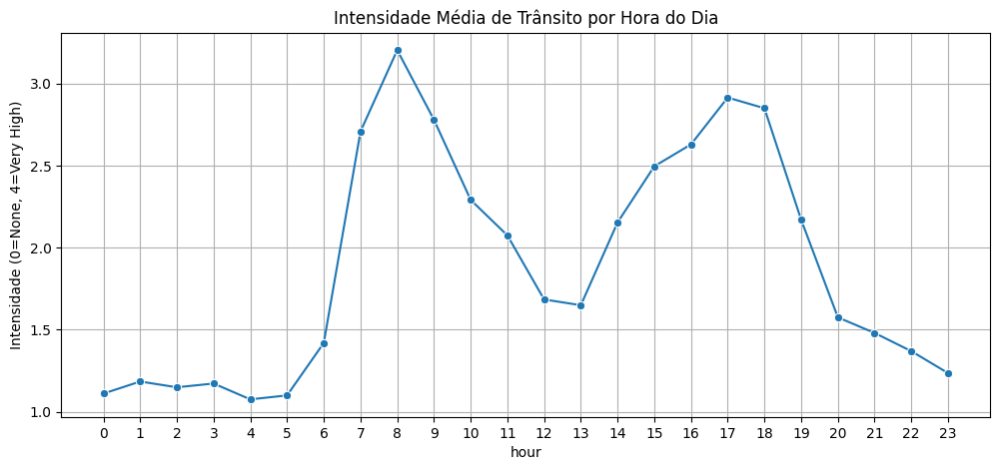

C:\Users\dirod\AppData\Local\Temp\ipykernel_23244\3465760845.py:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_train, x='weekday', y='target_num', order=days_order, palette="coolwarm", errorbar=None)


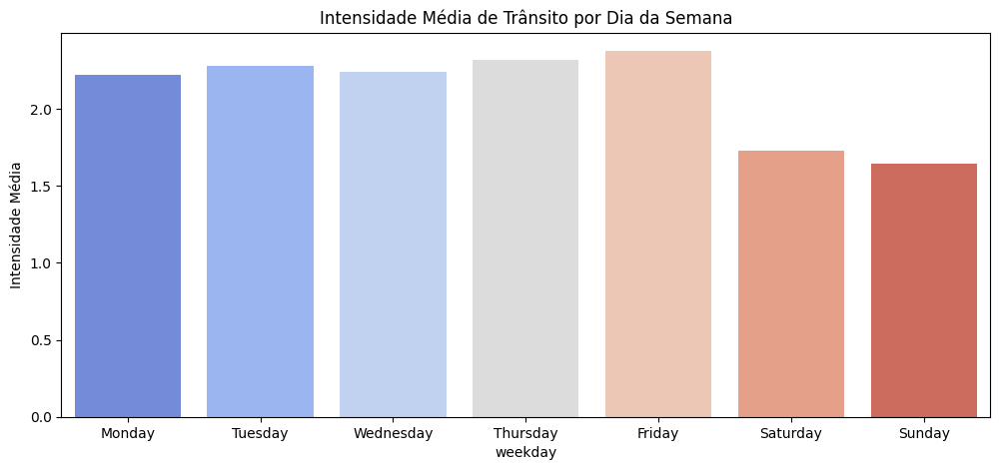

In [41]:
# Criar colunas auxiliares
df_train['record_date'] = pd.to_datetime(df_train['record_date'])

df_train['hour'] = df_train['record_date'].dt.hour
df_train['weekday'] = df_train['record_date'].dt.day_name()

# Mapear target para números para poder calcular média de "intensidade de trânsito"
target_map = {'None': 0, 'Low': 1, 'Medium': 2, 'High': 3, 'Very_High': 4}
df_train['target_num'] = df_train['AVERAGE_SPEED_DIFF'].map(target_map)

# 1. Trânsito por Hora do Dia
plt.figure(figsize=(12, 5))
sns.lineplot(data=df_train, x='hour', y='target_num', estimator='mean', errorbar=None, marker='o')
plt.title('Intensidade Média de Trânsito por Hora do Dia')
plt.ylabel('Intensidade (0=None, 4=Very High)')
plt.xticks(range(0, 24))
plt.grid(True)
plt.show()

# 2. Trânsito por Dia da Semana (Ordenado)
days_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
plt.figure(figsize=(12, 5))
sns.barplot(data=df_train, x='weekday', y='target_num', order=days_order, palette="coolwarm", errorbar=None)
plt.title('Intensidade Média de Trânsito por Dia da Semana')
plt.ylabel('Intensidade Média')
plt.show()

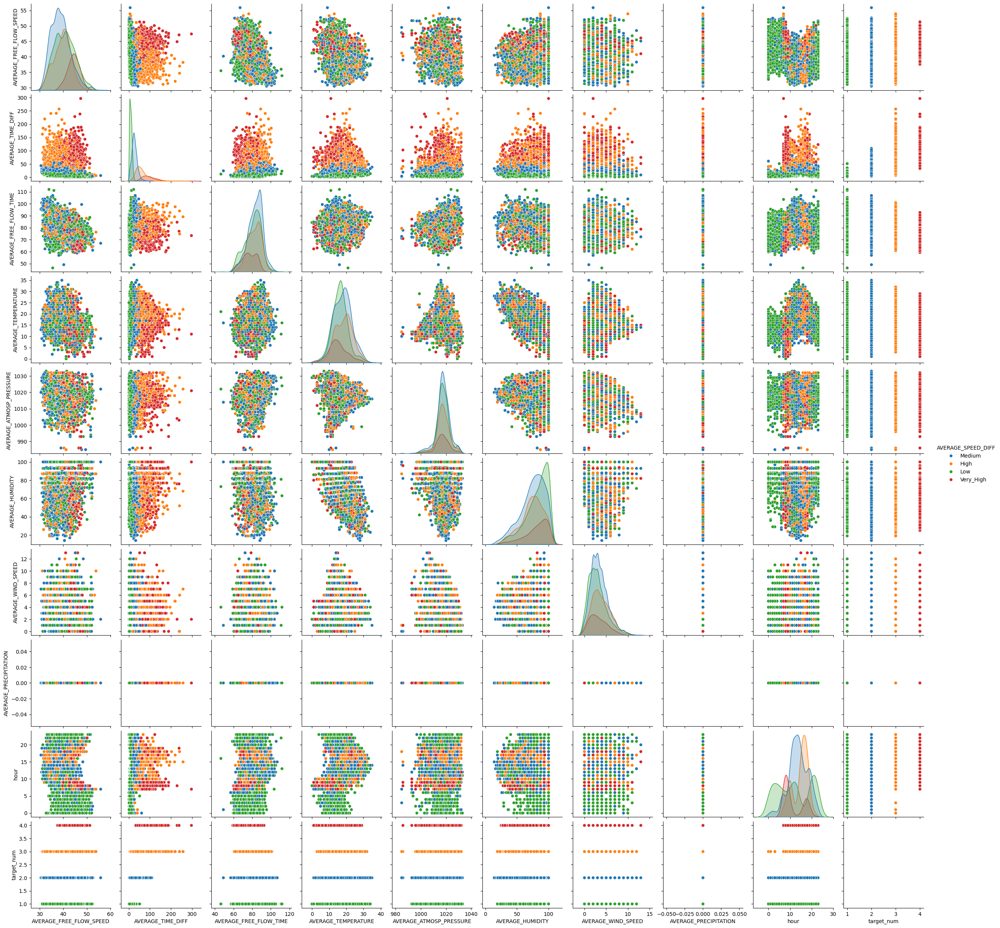

In [42]:
sns.pairplot(df_train, hue='AVERAGE_SPEED_DIFF')

<Axes: >

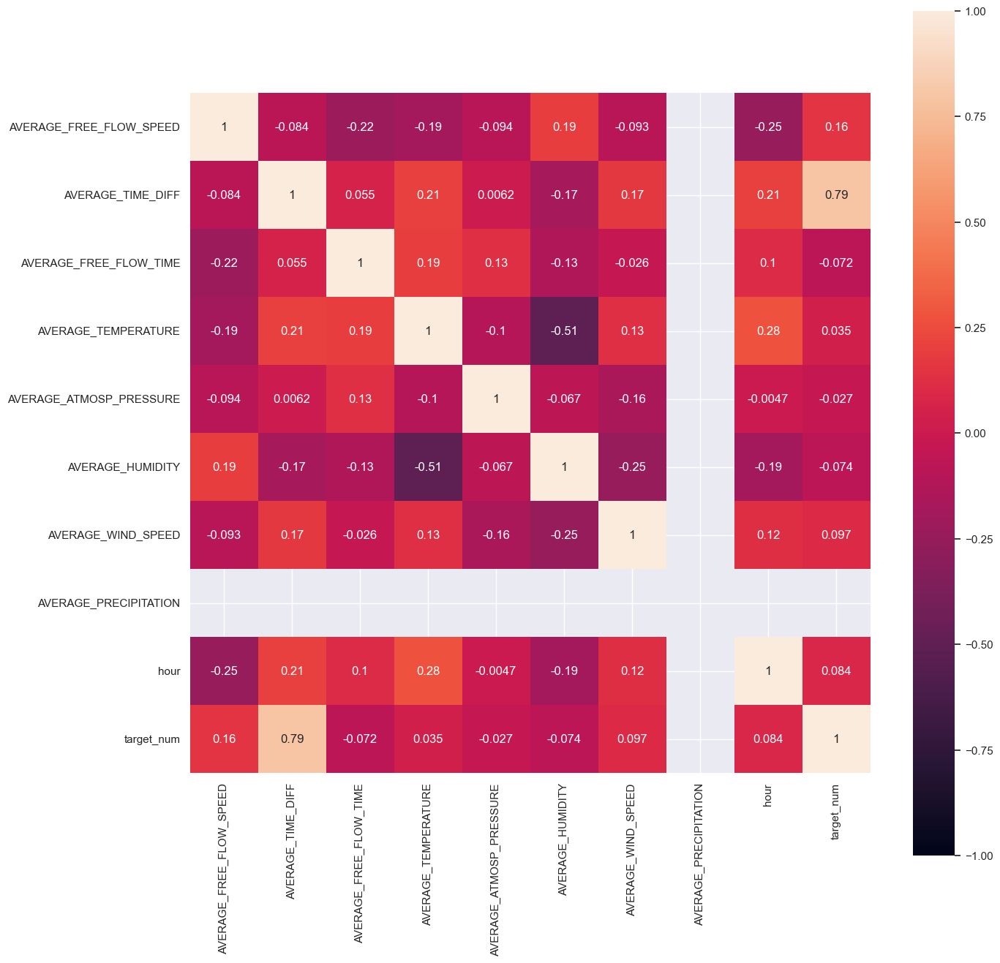

In [193]:
corr_matrix = df_train.corr(numeric_only=True)
f, ax = plt.subplots(figsize=(15, 15))
sns.heatmap(corr_matrix, vmin=-1, vmax=1, square=True, annot=True)

Skewness AVERAGE_FREE_FLOW_SPEED: 0.10973130090136157
Kurtosis AVERAGE_FREE_FLOW_SPEED: -0.32436675582163543
Skewness AVERAGE_TIME_DIFF: 2.0422071795699384
Kurtosis AVERAGE_TIME_DIFF: 5.111165221965141
Skewness AVERAGE_FREE_FLOW_TIME: -0.3657608786050427
Kurtosis AVERAGE_FREE_FLOW_TIME: -0.20963522546324098
Skewness AVERAGE_TEMPERATURE: 0.18183281232109305
Kurtosis AVERAGE_TEMPERATURE: 0.286518504630612


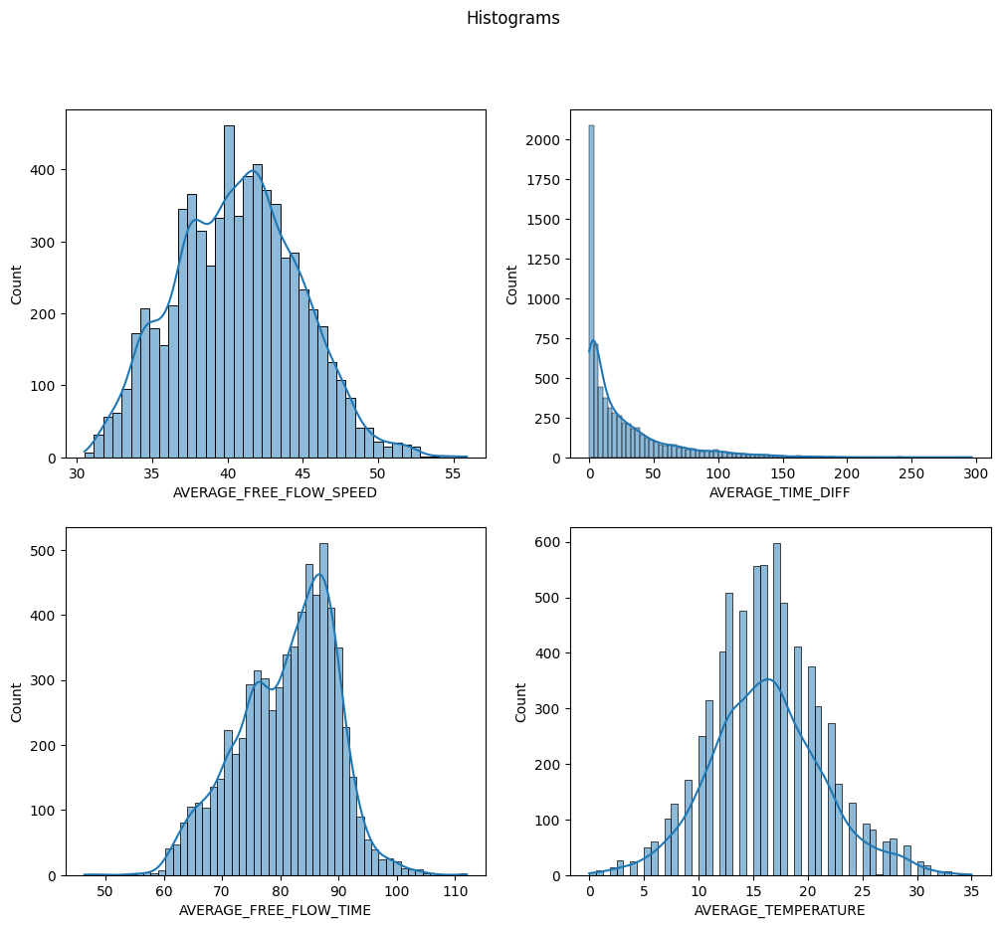

In [44]:
fig, axs = plt.subplots(2, 2, figsize=(12, 10))
fig.suptitle('Histograms')

sns.histplot(df_train['AVERAGE_FREE_FLOW_SPEED'], ax=axs[0, 0], kde=True)
sns.histplot(df_train['AVERAGE_TIME_DIFF'], ax=axs[0, 1], kde=True)
sns.histplot(df_train['AVERAGE_FREE_FLOW_TIME'], ax=axs[1, 0], kde=True)
sns.histplot(df_train['AVERAGE_TEMPERATURE'], ax=axs[1, 1], kde=True)

print(f"Skewness AVERAGE_FREE_FLOW_SPEED: {df_train['AVERAGE_FREE_FLOW_SPEED'].skew()}")
print(f"Kurtosis AVERAGE_FREE_FLOW_SPEED: {df_train['AVERAGE_FREE_FLOW_SPEED'].kurt()}")
print(f"Skewness AVERAGE_TIME_DIFF: {df_train['AVERAGE_TIME_DIFF'].skew()}")
print(f"Kurtosis AVERAGE_TIME_DIFF: {df_train['AVERAGE_TIME_DIFF'].kurt()}")
print(f"Skewness AVERAGE_FREE_FLOW_TIME: {df_train['AVERAGE_FREE_FLOW_TIME'].skew()}")
print(f"Kurtosis AVERAGE_FREE_FLOW_TIME: {df_train['AVERAGE_FREE_FLOW_TIME'].kurt()}")
print(f"Skewness AVERAGE_TEMPERATURE: {df_train['AVERAGE_TEMPERATURE'].skew()}")
print(f"Kurtosis AVERAGE_TEMPERATURE: {df_train['AVERAGE_TEMPERATURE'].kurt()}")

Skewness AVERAGE_ATMOSP_PRESSURE: -0.8233601395441663
Kurtosis AVERAGE_ATMOSP_PRESSURE: 3.505226254075301
Skewness AVERAGE_HUMIDITY: -0.9659999200206433
Kurtosis AVERAGE_HUMIDITY: 0.3497493709599926
Skewness AVERAGE_WIND_SPEED: 0.8734786776888487
Kurtosis AVERAGE_WIND_SPEED: 0.8870753085026761
Skewness AVERAGE_PRECIPITATION: 0.0
Kurtosis AVERAGE_PRECIPITATION: 0.0


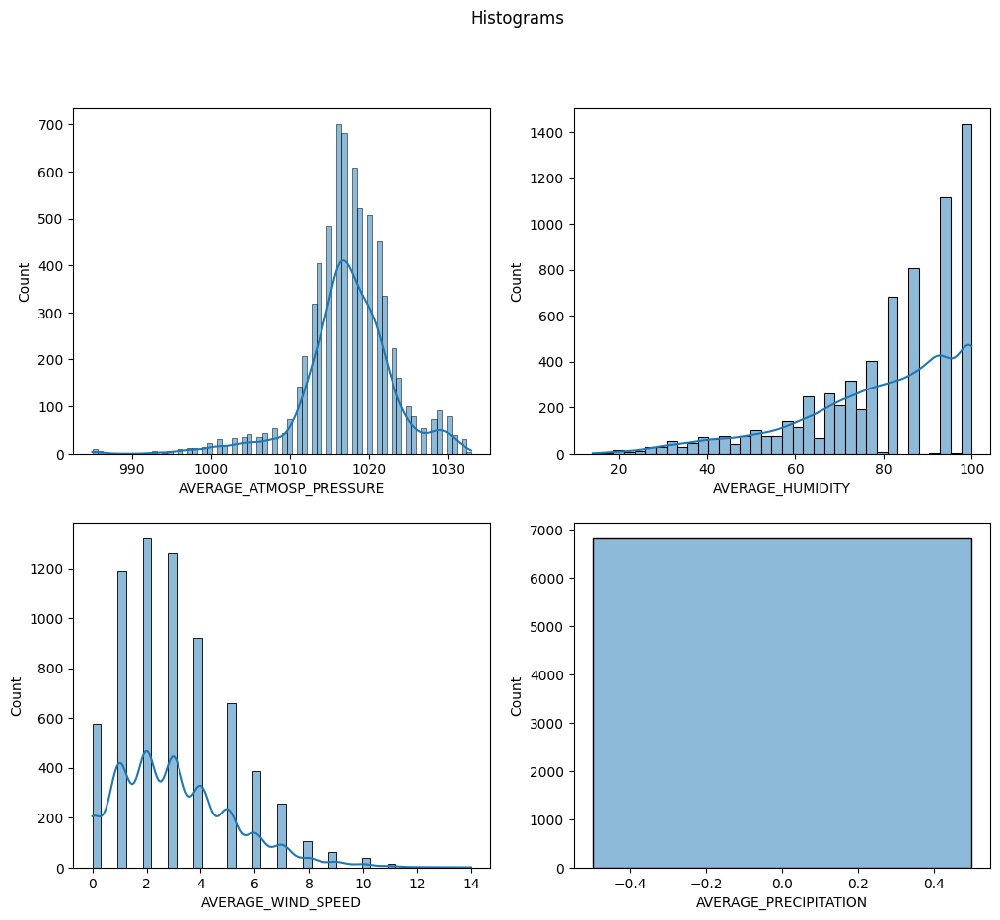

In [45]:
fig, axs = plt.subplots(2, 2, figsize=(12, 10))
fig.suptitle('Histograms')

sns.histplot(df_train['AVERAGE_ATMOSP_PRESSURE'], ax=axs[0, 0], kde=True)
sns.histplot(df_train['AVERAGE_HUMIDITY'], ax=axs[0, 1], kde=True)
sns.histplot(df_train['AVERAGE_WIND_SPEED'], ax=axs[1, 0], kde=True)
sns.histplot(df_train['AVERAGE_PRECIPITATION'], ax=axs[1, 1], kde=True)

print(f"Skewness AVERAGE_ATMOSP_PRESSURE: {df_train['AVERAGE_ATMOSP_PRESSURE'].skew()}")
print(f"Kurtosis AVERAGE_ATMOSP_PRESSURE: {df_train['AVERAGE_ATMOSP_PRESSURE'].kurt()}")
print(f"Skewness AVERAGE_HUMIDITY: {df_train['AVERAGE_HUMIDITY'].skew()}")
print(f"Kurtosis AVERAGE_HUMIDITY: {df_train['AVERAGE_HUMIDITY'].kurt()}")
print(f"Skewness AVERAGE_WIND_SPEED: {df_train['AVERAGE_WIND_SPEED'].skew()}")
print(f"Kurtosis AVERAGE_WIND_SPEED: {df_train['AVERAGE_WIND_SPEED'].kurt()}")
print(f"Skewness AVERAGE_PRECIPITATION: {df_train['AVERAGE_PRECIPITATION'].skew()}")
print(f"Kurtosis AVERAGE_PRECIPITATION: {df_train['AVERAGE_PRECIPITATION'].kurt()}")

## 1 - Análise de missing values

##### Aqui podemos ver que os atributos "AVERAGE_SPEED_DIFF", "AVERAGE_CLOUDINESS", "AVERAGE_RAIN" têm missing values, tendo a "AVERAGE_RAIN" a maioria deles

In [46]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6812 entries, 0 to 6811
Data columns (total 17 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   city_name                6812 non-null   object        
 1   record_date              6812 non-null   datetime64[ns]
 2   AVERAGE_SPEED_DIFF       4612 non-null   object        
 3   AVERAGE_FREE_FLOW_SPEED  6812 non-null   float64       
 4   AVERAGE_TIME_DIFF        6812 non-null   float64       
 5   AVERAGE_FREE_FLOW_TIME   6812 non-null   float64       
 6   LUMINOSITY               6812 non-null   object        
 7   AVERAGE_TEMPERATURE      6812 non-null   float64       
 8   AVERAGE_ATMOSP_PRESSURE  6812 non-null   float64       
 9   AVERAGE_HUMIDITY         6812 non-null   float64       
 10  AVERAGE_WIND_SPEED       6812 non-null   float64       
 11  AVERAGE_CLOUDINESS       4130 non-null   object        
 12  AVERAGE_PRECIPITATION    6812 non-

In [47]:
df_train.isna().any()

city_name                  False
record_date                False
AVERAGE_SPEED_DIFF          True
AVERAGE_FREE_FLOW_SPEED    False
AVERAGE_TIME_DIFF          False
AVERAGE_FREE_FLOW_TIME     False
LUMINOSITY                 False
AVERAGE_TEMPERATURE        False
AVERAGE_ATMOSP_PRESSURE    False
AVERAGE_HUMIDITY           False
AVERAGE_WIND_SPEED         False
AVERAGE_CLOUDINESS          True
AVERAGE_PRECIPITATION      False
AVERAGE_RAIN                True
hour                       False
weekday                    False
target_num                  True
dtype: bool

In [48]:
df_train.isna().sum()

city_name                     0
record_date                   0
AVERAGE_SPEED_DIFF         2200
AVERAGE_FREE_FLOW_SPEED       0
AVERAGE_TIME_DIFF             0
AVERAGE_FREE_FLOW_TIME        0
LUMINOSITY                    0
AVERAGE_TEMPERATURE           0
AVERAGE_ATMOSP_PRESSURE       0
AVERAGE_HUMIDITY              0
AVERAGE_WIND_SPEED            0
AVERAGE_CLOUDINESS         2682
AVERAGE_PRECIPITATION         0
AVERAGE_RAIN               6249
hour                          0
weekday                       0
target_num                 2200
dtype: int64

<Axes: >

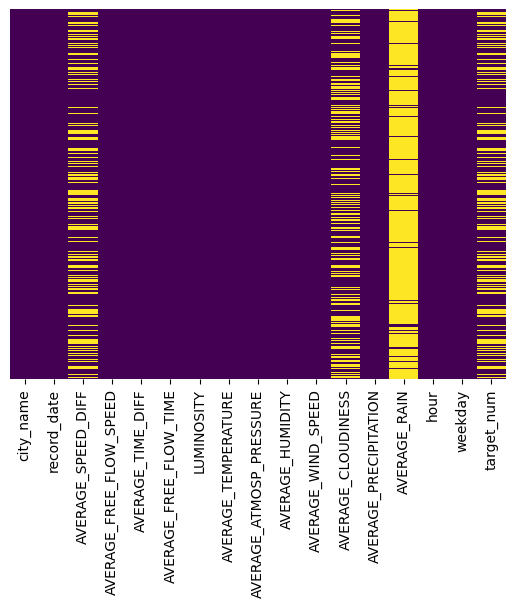

In [49]:
sns.heatmap(df_train.isnull(), yticklabels=False, cbar=False, cmap='viridis')

In [50]:
print(df_train['AVERAGE_CLOUDINESS'].value_counts())

AVERAGE_CLOUDINESS
céu claro            1582
céu pouco nublado     516
nuvens dispersas      459
nuvens quebrados      448
algumas nuvens        422
nuvens quebradas      416
céu limpo             153
tempo nublado          67
nublado                67
Name: count, dtype: int64


##### Aqui podemos ver que os atributos "AVERAGE_CLOUDINESS", "AVERAGE_RAIN" têm missing values, tendo a "AVERAGE_RAIN" a maioria deles

In [51]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1500 entries, 0 to 1499
Data columns (total 13 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   city_name                1500 non-null   object 
 1   record_date              1500 non-null   object 
 2   AVERAGE_FREE_FLOW_SPEED  1500 non-null   float64
 3   AVERAGE_TIME_DIFF        1500 non-null   float64
 4   AVERAGE_FREE_FLOW_TIME   1500 non-null   float64
 5   LUMINOSITY               1500 non-null   object 
 6   AVERAGE_TEMPERATURE      1500 non-null   float64
 7   AVERAGE_ATMOSP_PRESSURE  1500 non-null   float64
 8   AVERAGE_HUMIDITY         1500 non-null   float64
 9   AVERAGE_WIND_SPEED       1500 non-null   float64
 10  AVERAGE_CLOUDINESS       901 non-null    object 
 11  AVERAGE_PRECIPITATION    1500 non-null   float64
 12  AVERAGE_RAIN             140 non-null    object 
dtypes: float64(8), object(5)
memory usage: 152.5+ KB


In [52]:
df_test.isna().any()

city_name                  False
record_date                False
AVERAGE_FREE_FLOW_SPEED    False
AVERAGE_TIME_DIFF          False
AVERAGE_FREE_FLOW_TIME     False
LUMINOSITY                 False
AVERAGE_TEMPERATURE        False
AVERAGE_ATMOSP_PRESSURE    False
AVERAGE_HUMIDITY           False
AVERAGE_WIND_SPEED         False
AVERAGE_CLOUDINESS          True
AVERAGE_PRECIPITATION      False
AVERAGE_RAIN                True
dtype: bool

In [53]:
df_test.isna().sum()

city_name                     0
record_date                   0
AVERAGE_FREE_FLOW_SPEED       0
AVERAGE_TIME_DIFF             0
AVERAGE_FREE_FLOW_TIME        0
LUMINOSITY                    0
AVERAGE_TEMPERATURE           0
AVERAGE_ATMOSP_PRESSURE       0
AVERAGE_HUMIDITY              0
AVERAGE_WIND_SPEED            0
AVERAGE_CLOUDINESS          599
AVERAGE_PRECIPITATION         0
AVERAGE_RAIN               1360
dtype: int64

<Axes: >

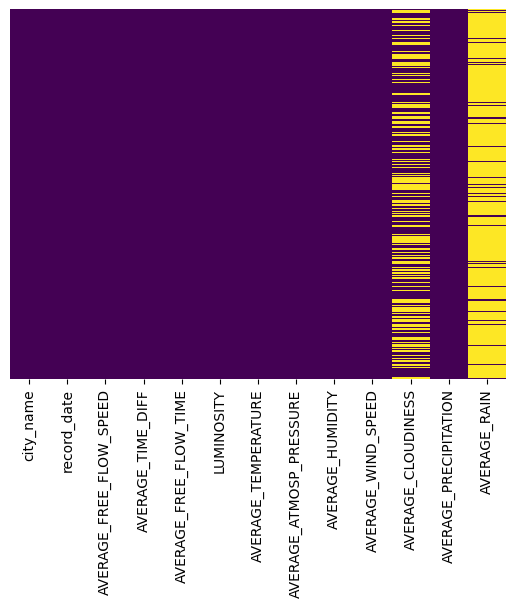

In [54]:
sns.heatmap(df_test.isnull(), yticklabels=False, cbar=False, cmap='viridis')

In [55]:
print(df_test['AVERAGE_CLOUDINESS'].value_counts())

AVERAGE_CLOUDINESS
céu claro            345
céu pouco nublado    109
algumas nuvens        98
nuvens quebrados      96
nuvens quebradas      95
nuvens dispersas      94
céu limpo             27
tempo nublado         20
nublado               17
Name: count, dtype: int64


## 2 - Análise dos valores únicos

In [56]:
print(df_train.nunique())
print(df_test.nunique())

city_name                     1
record_date                6812
AVERAGE_SPEED_DIFF            4
AVERAGE_FREE_FLOW_SPEED     225
AVERAGE_TIME_DIFF          1151
AVERAGE_FREE_FLOW_TIME      442
LUMINOSITY                    3
AVERAGE_TEMPERATURE          38
AVERAGE_ATMOSP_PRESSURE      43
AVERAGE_HUMIDITY             77
AVERAGE_WIND_SPEED           15
AVERAGE_CLOUDINESS            9
AVERAGE_PRECIPITATION         1
AVERAGE_RAIN                 13
hour                         24
weekday                       7
target_num                    4
dtype: int64
city_name                     1
record_date                1500
AVERAGE_FREE_FLOW_SPEED     199
AVERAGE_TIME_DIFF           610
AVERAGE_FREE_FLOW_TIME      337
LUMINOSITY                    3
AVERAGE_TEMPERATURE          32
AVERAGE_ATMOSP_PRESSURE      42
AVERAGE_HUMIDITY             70
AVERAGE_WIND_SPEED           14
AVERAGE_CLOUDINESS            9
AVERAGE_PRECIPITATION         1
AVERAGE_RAIN                  9
dtype: int64


## Tratamento dos dados

### Remoção da coluna 'city_name'

In [57]:
df_train.drop(['city_name'], axis= 1, inplace= True)
df_test.drop(['city_name'], axis= 1, inplace= True)

In [58]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6812 entries, 0 to 6811
Data columns (total 16 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   record_date              6812 non-null   datetime64[ns]
 1   AVERAGE_SPEED_DIFF       4612 non-null   object        
 2   AVERAGE_FREE_FLOW_SPEED  6812 non-null   float64       
 3   AVERAGE_TIME_DIFF        6812 non-null   float64       
 4   AVERAGE_FREE_FLOW_TIME   6812 non-null   float64       
 5   LUMINOSITY               6812 non-null   object        
 6   AVERAGE_TEMPERATURE      6812 non-null   float64       
 7   AVERAGE_ATMOSP_PRESSURE  6812 non-null   float64       
 8   AVERAGE_HUMIDITY         6812 non-null   float64       
 9   AVERAGE_WIND_SPEED       6812 non-null   float64       
 10  AVERAGE_CLOUDINESS       4130 non-null   object        
 11  AVERAGE_PRECIPITATION    6812 non-null   float64       
 12  AVERAGE_RAIN             563 non-n

In [59]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1500 entries, 0 to 1499
Data columns (total 12 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   record_date              1500 non-null   object 
 1   AVERAGE_FREE_FLOW_SPEED  1500 non-null   float64
 2   AVERAGE_TIME_DIFF        1500 non-null   float64
 3   AVERAGE_FREE_FLOW_TIME   1500 non-null   float64
 4   LUMINOSITY               1500 non-null   object 
 5   AVERAGE_TEMPERATURE      1500 non-null   float64
 6   AVERAGE_ATMOSP_PRESSURE  1500 non-null   float64
 7   AVERAGE_HUMIDITY         1500 non-null   float64
 8   AVERAGE_WIND_SPEED       1500 non-null   float64
 9   AVERAGE_CLOUDINESS       901 non-null    object 
 10  AVERAGE_PRECIPITATION    1500 non-null   float64
 11  AVERAGE_RAIN             140 non-null    object 
dtypes: float64(8), object(4)
memory usage: 140.8+ KB


In [60]:
df_train.to_csv("./Dataset/training_data_v2.csv", encoding="latin1", index=False)
df_test.to_csv("./Dataset/test_data_v2.csv", encoding="latin1", index=False)

### Tratamento dos valores de precipitação com extração dos valores de uma API externa e remoção da coluna de "AVERAGE_RAIN" (diz nos em valor categórico o mesmo que a coluna 'AVERAGE_PRECIPITATION')

In [61]:
import requests

# =========================================================
# 1. Função para obter precipitação histórica por hora
# =========================================================

def download_precipitation_history(start_date, end_date, lat=41.1579, lon=-8.6291):
    """
    Faz download da precipitação horária do Porto entre datas específicas.
    Retorna um DataFrame com 'record_date' e 'precipitation'.
    """
    
    url = (
        "https://archive-api.open-meteo.com/v1/archive?"
        f"latitude={lat}&longitude={lon}&"
        f"start_date={start_date}&end_date={end_date}&"
        "hourly=precipitation"
    )
    
    print("A obter dados meteorológicos reais...")
    r = requests.get(url)
    data = r.json()
    
    df_weather = pd.DataFrame({
        "record_date": pd.to_datetime(data["hourly"]["time"]),
        "PRECIPITATION_EXTERNAL": data["hourly"]["precipitation"]
    })
    
    return df_weather


# =========================================================
# 2. Função para preencher precipitação num dataset
# =========================================================

def fill_precipitation(df, df_weather):
    """
    Faz merge entre o dataset original e os dados meteorológicos.
    Preenche a coluna AVERAGE_PRECIPITATION com os valores reais.
    """
    
    df["record_date"] = pd.to_datetime(df["record_date"])
    df = df.merge(df_weather, on="record_date", how="left")

    # Substitui zeros ou nulos pela precipitação real
    df["AVERAGE_PRECIPITATION"] = df["PRECIPITATION_EXTERNAL"]

    # Remove coluna auxiliar
    df = df.drop(columns=["PRECIPITATION_EXTERNAL"])

    return df


# =========================================================
# 3. Carregar datasets originais
# =========================================================

df_train = pd.read_csv("./Dataset/training_data_v2.csv", encoding="latin1")
df_test  = pd.read_csv("./Dataset/test_data_v2.csv", encoding="latin1")

# Encontrar o intervalo total de datas
start_date = min(df_train["record_date"].min(), df_test["record_date"].min())
end_date   = max(df_train["record_date"].max(), df_test["record_date"].max())

start_date = str(start_date).split(" ")[0]
end_date   = str(end_date).split(" ")[0]

print(f"Iremos buscar dados desde {start_date} até {end_date}")

# =========================================================
# 4. Fazer download dos dados meteorológicos reais
# =========================================================

df_weather = download_precipitation_history(start_date, end_date)

# =========================================================
# 5. Preencher precipitação no train e no test
# =========================================================

df_train_filled = fill_precipitation(df_train, df_weather)
df_test_filled  = fill_precipitation(df_test, df_weather)

# =========================================================
# 6. Guardar novos ficheiros
# =========================================================

df_train_filled.to_csv("./Dataset/training_data_v3.csv", index=False, encoding="latin1")
df_test_filled.to_csv("./Dataset/test_data_v3.csv", index=False, encoding="latin1")

print("✔️ Concluído!")
print("Ficheiros gerados:")
print(" - training_data_v3.csv")
print(" - test_data_v3.csv")


Iremos buscar dados desde 2018-07-24 até 2019-09-30
A obter dados meteorológicos reais...
✔️ Concluído!
Ficheiros gerados:
 - training_data_v3.csv
 - test_data_v3.csv


In [62]:
df_train_precipitation = pd.read_csv("./Dataset/training_data_v3.csv", encoding="latin1")
df_test_precipitation = pd.read_csv("./Dataset/test_data_v3.csv", encoding="latin1")

In [63]:
print(df_train_precipitation.nunique())
print(df_test_precipitation.nunique())

record_date                6812
AVERAGE_SPEED_DIFF            4
AVERAGE_FREE_FLOW_SPEED     225
AVERAGE_TIME_DIFF          1151
AVERAGE_FREE_FLOW_TIME      442
LUMINOSITY                    3
AVERAGE_TEMPERATURE          38
AVERAGE_ATMOSP_PRESSURE      43
AVERAGE_HUMIDITY             77
AVERAGE_WIND_SPEED           15
AVERAGE_CLOUDINESS            9
AVERAGE_PRECIPITATION        56
AVERAGE_RAIN                 13
hour                         24
weekday                       7
target_num                    4
dtype: int64
record_date                1500
AVERAGE_FREE_FLOW_SPEED     199
AVERAGE_TIME_DIFF           610
AVERAGE_FREE_FLOW_TIME      337
LUMINOSITY                    3
AVERAGE_TEMPERATURE          32
AVERAGE_ATMOSP_PRESSURE      42
AVERAGE_HUMIDITY             70
AVERAGE_WIND_SPEED           14
AVERAGE_CLOUDINESS            9
AVERAGE_PRECIPITATION        36
AVERAGE_RAIN                  9
dtype: int64


In [64]:
df_train_precipitation.head()

,record_date,AVERAGE_SPEED_DIFF,AVERAGE_FREE_FLOW_SPEED,AVERAGE_TIME_DIFF,AVERAGE_FREE_FLOW_TIME,LUMINOSITY,AVERAGE_TEMPERATURE,AVERAGE_ATMOSP_PRESSURE,AVERAGE_HUMIDITY,AVERAGE_WIND_SPEED,AVERAGE_CLOUDINESS,AVERAGE_PRECIPITATION,AVERAGE_RAIN,hour,weekday,target_num
0,2019-08-29 07:00:00,Medium,41.5,11.5,71.4,LIGHT,15.0,1019.0,100.0,3.0,NaN,0.0,NaN,7,Thursday,2.0
1,2018-08-10 14:00:00,High,41.7,48.3,87.4,LIGHT,21.0,1021.0,53.0,5.0,céu claro,0.0,NaN,14,Friday,3.0
2,2019-09-01 16:00:00,High,38.6,38.4,85.2,LIGHT,26.0,1014.0,61.0,4.0,NaN,0.0,NaN,16,Sunday,3.0
3,2019-02-26 11:00:00,High,37.4,61.0,94.1,LIGHT,18.0,1025.0,48.0,4.0,céu claro,0.0,NaN,11,Tuesday,3.0
4,2019-06-06 12:00:00,Medium,41.6,50.4,77.0,LIGHT,15.0,1008.0,82.0,10.0,NaN,0.4,NaN,12,Thursday,2.0


In [65]:
df_train_precipitation.tail()

,record_date,AVERAGE_SPEED_DIFF,AVERAGE_FREE_FLOW_SPEED,AVERAGE_TIME_DIFF,AVERAGE_FREE_FLOW_TIME,LUMINOSITY,AVERAGE_TEMPERATURE,AVERAGE_ATMOSP_PRESSURE,AVERAGE_HUMIDITY,AVERAGE_WIND_SPEED,AVERAGE_CLOUDINESS,AVERAGE_PRECIPITATION,AVERAGE_RAIN,hour,weekday,target_num
6807,2019-02-23 09:00:00,Low,41.2,3.7,86.9,LIGHT,9.0,1030.0,71.0,4.0,céu claro,0.0,NaN,9,Saturday,1.0
6808,2019-06-08 18:00:00,Medium,38.9,51.9,76.9,LIGHT,17.0,1020.0,63.0,6.0,NaN,0.0,NaN,18,Saturday,2.0
6809,2018-10-02 04:00:00,NaN,39.6,0.0,89.1,DARK,15.0,1020.0,39.0,4.0,céu claro,0.0,NaN,4,Tuesday,NaN
6810,2019-01-30 01:00:00,NaN,41.6,0.0,85.5,DARK,8.0,1018.0,81.0,1.0,algumas nuvens,0.0,NaN,1,Wednesday,NaN
6811,2019-06-15 21:00:00,Medium,41.7,32.9,78.1,DARK,15.0,1021.0,72.0,4.0,NaN,0.0,NaN,21,Saturday,2.0


In [66]:
df_test_precipitation.head()

,record_date,AVERAGE_FREE_FLOW_SPEED,AVERAGE_TIME_DIFF,AVERAGE_FREE_FLOW_TIME,LUMINOSITY,AVERAGE_TEMPERATURE,AVERAGE_ATMOSP_PRESSURE,AVERAGE_HUMIDITY,AVERAGE_WIND_SPEED,AVERAGE_CLOUDINESS,AVERAGE_PRECIPITATION,AVERAGE_RAIN
0,2019-02-13 23:00:00,39.2,0.0,91.0,DARK,8.0,1026.0,71.0,1.0,céu claro,0.0,NaN
1,2018-11-28 20:00:00,42.5,12.2,76.8,DARK,11.0,1020.0,93.0,4.0,nuvens dispersas,0.0,NaN
2,2018-08-14 05:00:00,45.9,0.0,86.3,DARK,14.0,1017.0,93.0,0.0,NaN,0.0,NaN
3,2019-07-06 17:00:00,33.2,51.7,89.9,LIGHT,22.0,1016.0,77.0,4.0,céu pouco nublado,0.0,NaN
4,2018-10-15 06:00:00,44.0,3.5,85.5,DARK,12.0,1004.0,100.0,9.0,NaN,2.4,chuva fraca


In [67]:
df_test_precipitation.tail()

,record_date,AVERAGE_FREE_FLOW_SPEED,AVERAGE_TIME_DIFF,AVERAGE_FREE_FLOW_TIME,LUMINOSITY,AVERAGE_TEMPERATURE,AVERAGE_ATMOSP_PRESSURE,AVERAGE_HUMIDITY,AVERAGE_WIND_SPEED,AVERAGE_CLOUDINESS,AVERAGE_PRECIPITATION,AVERAGE_RAIN
1495,2018-11-24 05:00:00,50.2,1.1,80.5,DARK,11.0,1013.0,100.0,5.0,NaN,0.2,chuva fraca
1496,2019-03-01 02:00:00,38.0,4.6,85.6,DARK,9.0,1028.0,100.0,0.0,NaN,0.0,NaN
1497,2018-09-05 01:00:00,43.8,0.0,80.4,DARK,16.0,1013.0,100.0,1.0,NaN,0.0,NaN
1498,2018-11-05 08:00:00,46.0,83.2,83.2,LIGHT,10.0,1004.0,87.0,5.0,NaN,0.5,chuva moderada
1499,2019-08-18 13:00:00,41.7,15.9,93.0,LIGHT,21.0,1016.0,82.0,7.0,nuvens quebradas,0.0,NaN


In [68]:
df_train_precipitation.drop(['AVERAGE_RAIN'], axis= 1, inplace= True)
df_test_precipitation.drop(['AVERAGE_RAIN'], axis= 1, inplace= True)

In [69]:
df_train_precipitation.head()

,record_date,AVERAGE_SPEED_DIFF,AVERAGE_FREE_FLOW_SPEED,AVERAGE_TIME_DIFF,AVERAGE_FREE_FLOW_TIME,LUMINOSITY,AVERAGE_TEMPERATURE,AVERAGE_ATMOSP_PRESSURE,AVERAGE_HUMIDITY,AVERAGE_WIND_SPEED,AVERAGE_CLOUDINESS,AVERAGE_PRECIPITATION,hour,weekday,target_num
0,2019-08-29 07:00:00,Medium,41.5,11.5,71.4,LIGHT,15.0,1019.0,100.0,3.0,NaN,0.0,7,Thursday,2.0
1,2018-08-10 14:00:00,High,41.7,48.3,87.4,LIGHT,21.0,1021.0,53.0,5.0,céu claro,0.0,14,Friday,3.0
2,2019-09-01 16:00:00,High,38.6,38.4,85.2,LIGHT,26.0,1014.0,61.0,4.0,NaN,0.0,16,Sunday,3.0
3,2019-02-26 11:00:00,High,37.4,61.0,94.1,LIGHT,18.0,1025.0,48.0,4.0,céu claro,0.0,11,Tuesday,3.0
4,2019-06-06 12:00:00,Medium,41.6,50.4,77.0,LIGHT,15.0,1008.0,82.0,10.0,NaN,0.4,12,Thursday,2.0


In [70]:
df_test_precipitation.head()

,record_date,AVERAGE_FREE_FLOW_SPEED,AVERAGE_TIME_DIFF,AVERAGE_FREE_FLOW_TIME,LUMINOSITY,AVERAGE_TEMPERATURE,AVERAGE_ATMOSP_PRESSURE,AVERAGE_HUMIDITY,AVERAGE_WIND_SPEED,AVERAGE_CLOUDINESS,AVERAGE_PRECIPITATION
0,2019-02-13 23:00:00,39.2,0.0,91.0,DARK,8.0,1026.0,71.0,1.0,céu claro,0.0
1,2018-11-28 20:00:00,42.5,12.2,76.8,DARK,11.0,1020.0,93.0,4.0,nuvens dispersas,0.0
2,2018-08-14 05:00:00,45.9,0.0,86.3,DARK,14.0,1017.0,93.0,0.0,NaN,0.0
3,2019-07-06 17:00:00,33.2,51.7,89.9,LIGHT,22.0,1016.0,77.0,4.0,céu pouco nublado,0.0
4,2018-10-15 06:00:00,44.0,3.5,85.5,DARK,12.0,1004.0,100.0,9.0,NaN,2.4


In [71]:
df_train_precipitation.to_csv("./Dataset/training_data_v4.csv", index=False, encoding="latin1")
df_test_precipitation.to_csv("./Dataset/test_data_v4.csv", index=False, encoding="latin1")

## Análise dos dados duplicados

In [72]:
print(df_train_precipitation.duplicated().sum())

0


In [73]:
print(df_test_precipitation.duplicated().sum())

0


In [74]:
print(df_train_precipitation.drop_duplicates(inplace=True))
print(df_train_precipitation.info())

None
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6812 entries, 0 to 6811
Data columns (total 15 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   record_date              6812 non-null   object 
 1   AVERAGE_SPEED_DIFF       4612 non-null   object 
 2   AVERAGE_FREE_FLOW_SPEED  6812 non-null   float64
 3   AVERAGE_TIME_DIFF        6812 non-null   float64
 4   AVERAGE_FREE_FLOW_TIME   6812 non-null   float64
 5   LUMINOSITY               6812 non-null   object 
 6   AVERAGE_TEMPERATURE      6812 non-null   float64
 7   AVERAGE_ATMOSP_PRESSURE  6812 non-null   float64
 8   AVERAGE_HUMIDITY         6812 non-null   float64
 9   AVERAGE_WIND_SPEED       6812 non-null   float64
 10  AVERAGE_CLOUDINESS       4130 non-null   object 
 11  AVERAGE_PRECIPITATION    6812 non-null   float64
 12  hour                     6812 non-null   int64  
 13  weekday                  6812 non-null   object 
 14  target_num         

In [75]:
print(df_test_precipitation.drop_duplicates(inplace=True))
print(df_test_precipitation.info())

None
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1500 entries, 0 to 1499
Data columns (total 11 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   record_date              1500 non-null   object 
 1   AVERAGE_FREE_FLOW_SPEED  1500 non-null   float64
 2   AVERAGE_TIME_DIFF        1500 non-null   float64
 3   AVERAGE_FREE_FLOW_TIME   1500 non-null   float64
 4   LUMINOSITY               1500 non-null   object 
 5   AVERAGE_TEMPERATURE      1500 non-null   float64
 6   AVERAGE_ATMOSP_PRESSURE  1500 non-null   float64
 7   AVERAGE_HUMIDITY         1500 non-null   float64
 8   AVERAGE_WIND_SPEED       1500 non-null   float64
 9   AVERAGE_CLOUDINESS       901 non-null    object 
 10  AVERAGE_PRECIPITATION    1500 non-null   float64
dtypes: float64(8), object(3)
memory usage: 129.0+ KB
None


## Transformação dos dados categóricos em numéricos

### LUMINOSITY

##### Como este feature tem uma ordem física clara (DARK < LOW_LIGHT < LIGHT), usaremos Label Encoding manual para transformá-lo em numérico. 

In [76]:
print(df_train_precipitation['LUMINOSITY'].value_counts())

LUMINOSITY
LIGHT        3293
DARK         3253
LOW_LIGHT     266
Name: count, dtype: int64


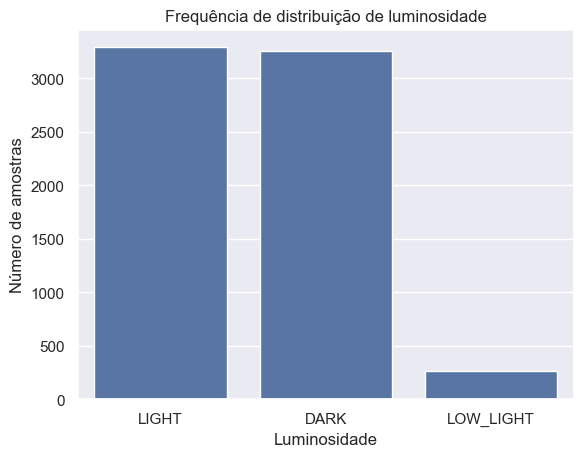

In [77]:
luminosity_count = df_train_precipitation['LUMINOSITY'].value_counts()
sns.set(style="darkgrid")
sns.barplot(x=luminosity_count.index, y=luminosity_count.values)
plt.xlabel('Luminosidade')
plt.ylabel('Número de amostras')
plt.title('Frequência de distribuição de luminosidade')
plt.show()

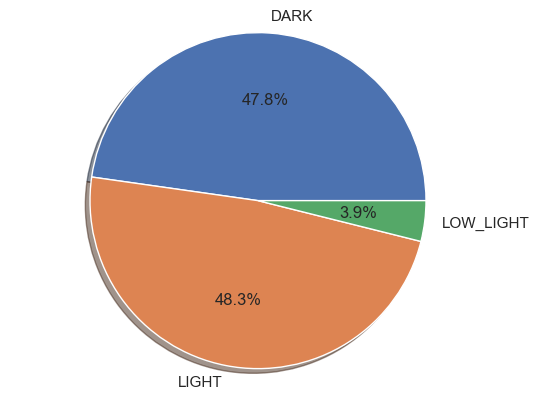

In [78]:
labels = df_train_precipitation['LUMINOSITY'].astype('category').cat.categories.tolist()
counts = df_train_precipitation['LUMINOSITY'].value_counts()
sizes = [counts[i] for i in labels]
fig1, ax1 = plt.subplots()
ax1.pie(sizes, labels=labels, autopct='%1.1f%%', shadow=True)
ax1.axis('equal')
plt.show()

In [79]:
replace_map = {'LUMINOSITY': {'DARK': 0, 'LOW_LIGHT': 1, 'LIGHT': 2}}
df_train_precipitation.replace(replace_map, inplace=True)

C:\Users\dirod\AppData\Local\Temp\ipykernel_23244\4252585586.py:2: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_train_precipitation.replace(replace_map, inplace=True)


In [80]:
print(df_train_precipitation['LUMINOSITY'].value_counts())

LUMINOSITY
2    3293
0    3253
1     266
Name: count, dtype: int64


In [81]:
print(df_test_precipitation['LUMINOSITY'].value_counts())

LUMINOSITY
DARK         730
LIGHT        725
LOW_LIGHT     45
Name: count, dtype: int64


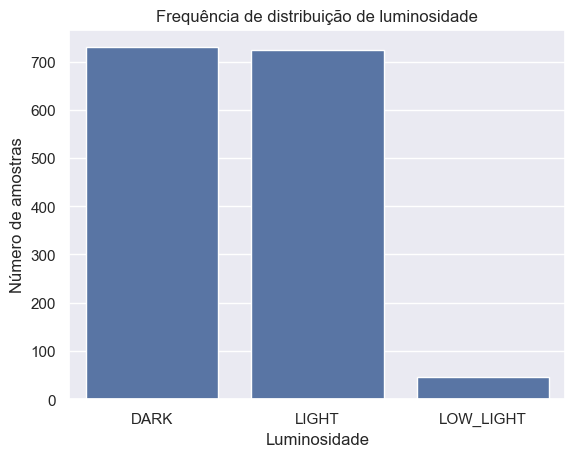

In [82]:
luminosity_count = df_test_precipitation['LUMINOSITY'].value_counts()
sns.set(style="darkgrid")
sns.barplot(x=luminosity_count.index, y=luminosity_count.values)
plt.xlabel('Luminosidade')
plt.ylabel('Número de amostras')
plt.title('Frequência de distribuição de luminosidade')
plt.show()

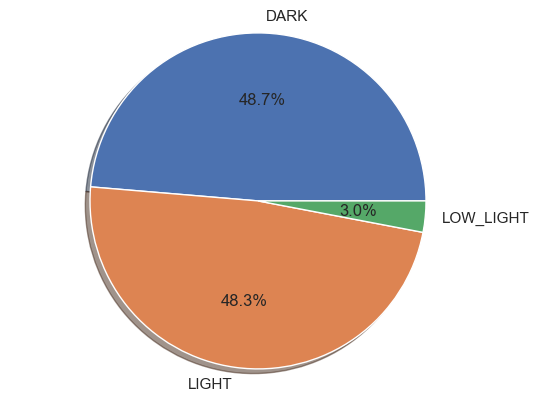

In [83]:
labels = df_test_precipitation['LUMINOSITY'].astype('category').cat.categories.tolist()
counts = df_test_precipitation['LUMINOSITY'].value_counts()
sizes = [counts[i] for i in labels]
fig1, ax1 = plt.subplots()
ax1.pie(sizes, labels=labels, autopct='%1.1f%%', shadow=True)
ax1.axis('equal')
plt.show()

In [84]:
replace_map = {'LUMINOSITY': {'DARK': 0, 'LOW_LIGHT': 1, 'LIGHT': 2}}
df_test_precipitation.replace(replace_map, inplace=True)

C:\Users\dirod\AppData\Local\Temp\ipykernel_23244\4051864522.py:2: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_test_precipitation.replace(replace_map, inplace=True)


In [85]:
print(df_test_precipitation['LUMINOSITY'].value_counts())

LUMINOSITY
0    730
2    725
1     45
Name: count, dtype: int64


### AVERAGE_SPEED_DIFF

In [86]:
print(df_train_precipitation['AVERAGE_SPEED_DIFF'].value_counts())

AVERAGE_SPEED_DIFF
Medium       1651
Low          1419
High         1063
Very_High     479
Name: count, dtype: int64


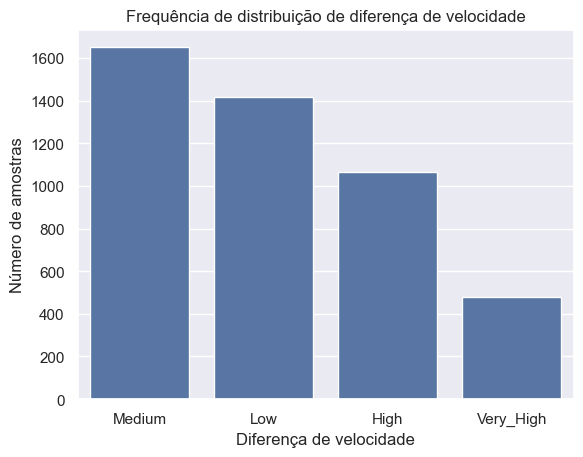

In [87]:
average_speed_diff_count = df_train_precipitation['AVERAGE_SPEED_DIFF'].value_counts()
sns.set(style="darkgrid")
sns.barplot(x=average_speed_diff_count.index, y=average_speed_diff_count.values)
plt.xlabel('Diferença de velocidade')
plt.ylabel('Número de amostras')
plt.title('Frequência de distribuição de diferença de velocidade')
plt.show()

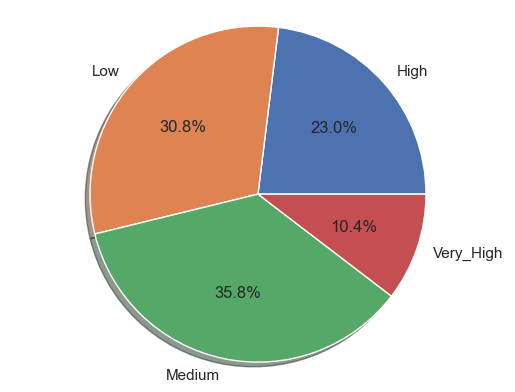

In [88]:
labels = df_train_precipitation['AVERAGE_SPEED_DIFF'].astype('category').cat.categories.tolist()
counts = df_train_precipitation['AVERAGE_SPEED_DIFF'].value_counts()
sizes = [counts[i] for i in labels]
fig1, ax1 = plt.subplots()
ax1.pie(sizes, labels=labels, autopct='%1.1f%%', shadow=True)
ax1.axis('equal')
plt.show()

<Axes: >

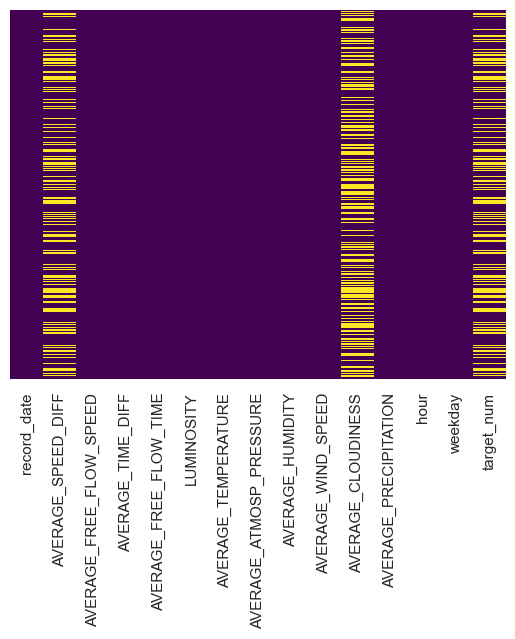

In [89]:
sns.heatmap(df_train_precipitation.isnull(), yticklabels=False, cbar=False, cmap='viridis')

In [90]:
print("Número de nulos:", df_train_precipitation['AVERAGE_SPEED_DIFF'].isnull().sum())

Número de nulos: 2200


#### Aqui podemos ver que existem missing values para a variável AVERAGE_SPEED_DIFF, mas isso deve-se ao facto de o 0 (que é considerado trânsito nulo) ser colocado como None, por isso faremos o encoding para 0 dos None

In [91]:
df_train_precipitation['AVERAGE_SPEED_DIFF'] = df_train_precipitation['AVERAGE_SPEED_DIFF'].fillna('None')
target_map = {'AVERAGE_SPEED_DIFF': {'None': 0, 'Low': 1, 'Medium': 2, 'High': 3, 'Very_High': 4}}
df_train_precipitation.replace(target_map, inplace=True)

C:\Users\dirod\AppData\Local\Temp\ipykernel_23244\2913982149.py:3: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_train_precipitation.replace(target_map, inplace=True)


In [92]:
print("Número de nulos:", df_train_precipitation['AVERAGE_SPEED_DIFF'].isnull().sum())

Número de nulos: 0


In [93]:
print(df_train_precipitation['AVERAGE_SPEED_DIFF'].value_counts())

AVERAGE_SPEED_DIFF
0    2200
2    1651
1    1419
3    1063
4     479
Name: count, dtype: int64


### AVERAGE_CLOUDINESS

In [94]:
print(df_train_precipitation['AVERAGE_CLOUDINESS'].value_counts())

AVERAGE_CLOUDINESS
céu claro            1582
céu pouco nublado     516
nuvens dispersas      459
nuvens quebrados      448
algumas nuvens        422
nuvens quebradas      416
céu limpo             153
tempo nublado          67
nublado                67
Name: count, dtype: int64


In [95]:
print(df_test_precipitation['AVERAGE_CLOUDINESS'].value_counts())

AVERAGE_CLOUDINESS
céu claro            345
céu pouco nublado    109
algumas nuvens        98
nuvens quebrados      96
nuvens quebradas      95
nuvens dispersas      94
céu limpo             27
tempo nublado         20
nublado               17
Name: count, dtype: int64


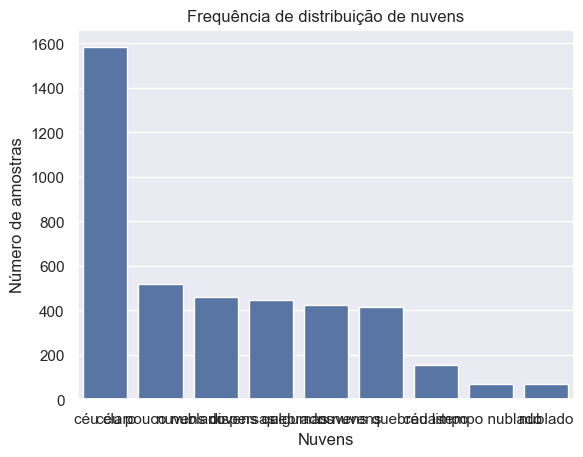

In [96]:
cloudiness_count = df_train_precipitation['AVERAGE_CLOUDINESS'].value_counts()
sns.set(style="darkgrid")
sns.barplot(x=cloudiness_count.index, y=cloudiness_count.values)
plt.xlabel('Nuvens')
plt.ylabel('Número de amostras')
plt.title('Frequência de distribuição de nuvens')
plt.show()

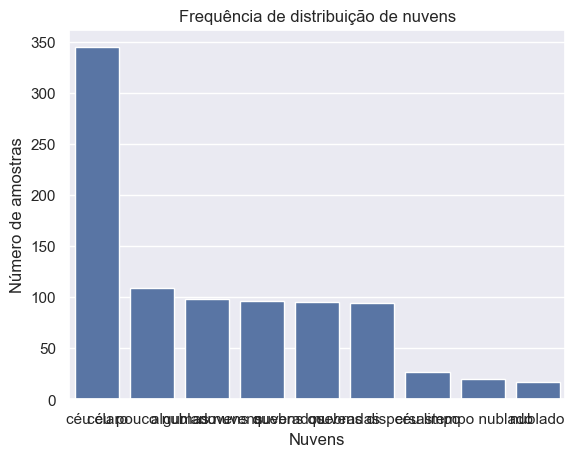

In [97]:
cloudiness_count = df_test_precipitation['AVERAGE_CLOUDINESS'].value_counts()
sns.set(style="darkgrid")
sns.barplot(x=cloudiness_count.index, y=cloudiness_count.values)
plt.xlabel('Nuvens')
plt.ylabel('Número de amostras')
plt.title('Frequência de distribuição de nuvens')
plt.show()

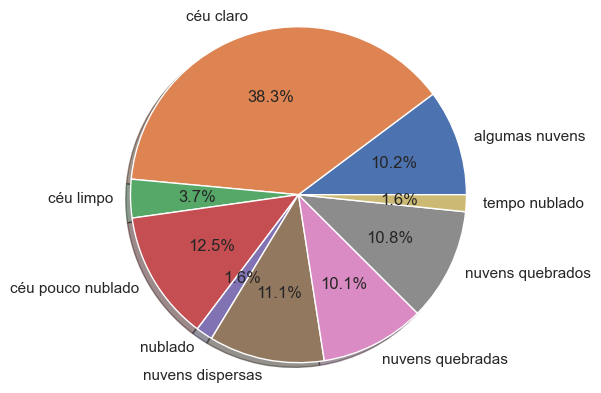

In [98]:
labels = df_train_precipitation['AVERAGE_CLOUDINESS'].astype('category').cat.categories.tolist()
counts = df_train_precipitation['AVERAGE_CLOUDINESS'].value_counts()
sizes = [counts[i] for i in labels]
fig1, ax1 = plt.subplots()
ax1.pie(sizes, labels=labels, autopct='%1.1f%%', shadow=True)
ax1.axis('equal')
plt.show()

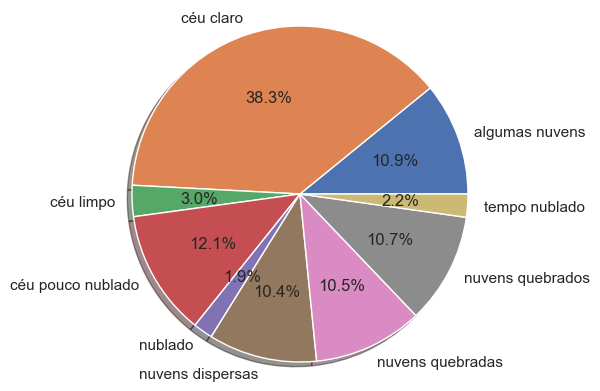

In [99]:
labels = df_test_precipitation['AVERAGE_CLOUDINESS'].astype('category').cat.categories.tolist()
counts = df_test_precipitation['AVERAGE_CLOUDINESS'].value_counts()
sizes = [counts[i] for i in labels]
fig1, ax1 = plt.subplots()
ax1.pie(sizes, labels=labels, autopct='%1.1f%%', shadow=True)
ax1.axis('equal')
plt.show()

In [100]:
def clean_and_encode_cloudiness(df, col='AVERAGE_CLOUDINESS'):

    df = df.copy()
    
    # 2. Converter para string e normalizar
    df[col] = df[col].astype(str).str.lower().str.strip()
    
    cloudiness_map = {
        # Valores corrompidos com encoding UTF-8 errado
        'cãâ©u claro': 'ceu_limpo',
        'cãâ©u limpo': 'ceu_limpo',
        'cãâ©u pouco nublado': 'pouco_nublado',
        
        # Valores corretos (caso existam)
        'céu claro': 'ceu_limpo',
        'céu limpo': 'ceu_limpo',
        'céu pouco nublado': 'scattered',
        
        # Resto das categorias
        'algumas nuvens': 'scattered',
        'nuvens dispersas': 'scattered',
        'nuvens quebradas': 'nuvens_quebradas',
        'nuvens quebrados': 'nuvens_quebradas',  # erro ortográfico
        'tempo nublado': 'muito_nublado',
        'nublado': 'muito_nublado',
        
        # Tratar NULL/NaN
        'null': None,
        'nan': None,
        '': None
    }
    
    # Aplicar mapeamento
    df[col + '_clean'] = df[col].map(cloudiness_map)
    
    # 4. Verificar se há valores não mapeados
    unmapped = df[df[col + '_clean'].isna()][col].unique()
    if len(unmapped) > 0:
        print(f"⚠️ Valores não mapeados encontrados: {unmapped}")
        print("Adicionando ao mapeamento como 'desconhecido'...")
    
    # 5. Ordem meteorológica (baseada em oktas - escala internacional)
    ordinal_map = {
        'ceu_limpo': 0,          
        'scattered': 1,    
        'nuvens_quebradas': 2,   
        'muito_nublado': 3     
    }
    
    # 6. Aplicar encoding ordinal
    df['cloudiness_encoded'] = df[col + '_clean'].map(ordinal_map)
    
    # 8. Remover coluna intermediária
    df = df.drop(columns=[col + '_clean'])
    
    return df


# Antes do encoding - verificar valores únicos
print("📊 Valores ANTES do encoding (train):")
print(df_train_precipitation['AVERAGE_CLOUDINESS'].value_counts())
print()
print(df_test_precipitation['AVERAGE_CLOUDINESS'].value_counts())

# Aplicar encoding
df_train_cloudiness = clean_and_encode_cloudiness(df_train_precipitation)
df_test_cloudiness = clean_and_encode_cloudiness(df_test_precipitation)

📊 Valores ANTES do encoding (train):
AVERAGE_CLOUDINESS
céu claro            1582
céu pouco nublado     516
nuvens dispersas      459
nuvens quebrados      448
algumas nuvens        422
nuvens quebradas      416
céu limpo             153
tempo nublado          67
nublado                67
Name: count, dtype: int64

AVERAGE_CLOUDINESS
céu claro            345
céu pouco nublado    109
algumas nuvens        98
nuvens quebrados      96
nuvens quebradas      95
nuvens dispersas      94
céu limpo             27
tempo nublado         20
nublado               17
Name: count, dtype: int64
⚠️ Valores não mapeados encontrados: ['nan']
Adicionando ao mapeamento como 'desconhecido'...
⚠️ Valores não mapeados encontrados: ['nan']
Adicionando ao mapeamento como 'desconhecido'...


In [101]:
# Verificar resultado
print("\n✅ Distribuição APÓS encoding:")
print(df_train_cloudiness['cloudiness_encoded'].value_counts().sort_index())
print()
print(df_test_cloudiness['cloudiness_encoded'].value_counts().sort_index())


✅ Distribuição APÓS encoding:
cloudiness_encoded
0.0    1735
1.0    1397
2.0     864
3.0     134
Name: count, dtype: int64

cloudiness_encoded
0.0    372
1.0    301
2.0    191
3.0     37
Name: count, dtype: int64


In [102]:
df_train_cloudiness.head()

,record_date,AVERAGE_SPEED_DIFF,AVERAGE_FREE_FLOW_SPEED,AVERAGE_TIME_DIFF,AVERAGE_FREE_FLOW_TIME,LUMINOSITY,AVERAGE_TEMPERATURE,AVERAGE_ATMOSP_PRESSURE,AVERAGE_HUMIDITY,AVERAGE_WIND_SPEED,AVERAGE_CLOUDINESS,AVERAGE_PRECIPITATION,hour,weekday,target_num,cloudiness_encoded
0,2019-08-29 07:00:00,2,41.5,11.5,71.4,2,15.0,1019.0,100.0,3.0,nan,0.0,7,Thursday,2.0,NaN
1,2018-08-10 14:00:00,3,41.7,48.3,87.4,2,21.0,1021.0,53.0,5.0,céu claro,0.0,14,Friday,3.0,0.0
2,2019-09-01 16:00:00,3,38.6,38.4,85.2,2,26.0,1014.0,61.0,4.0,nan,0.0,16,Sunday,3.0,NaN
3,2019-02-26 11:00:00,3,37.4,61.0,94.1,2,18.0,1025.0,48.0,4.0,céu claro,0.0,11,Tuesday,3.0,0.0
4,2019-06-06 12:00:00,2,41.6,50.4,77.0,2,15.0,1008.0,82.0,10.0,nan,0.4,12,Thursday,2.0,NaN


In [103]:
df_train_cloudiness.tail()

,record_date,AVERAGE_SPEED_DIFF,AVERAGE_FREE_FLOW_SPEED,AVERAGE_TIME_DIFF,AVERAGE_FREE_FLOW_TIME,LUMINOSITY,AVERAGE_TEMPERATURE,AVERAGE_ATMOSP_PRESSURE,AVERAGE_HUMIDITY,AVERAGE_WIND_SPEED,AVERAGE_CLOUDINESS,AVERAGE_PRECIPITATION,hour,weekday,target_num,cloudiness_encoded
6807,2019-02-23 09:00:00,1,41.2,3.7,86.9,2,9.0,1030.0,71.0,4.0,céu claro,0.0,9,Saturday,1.0,0.0
6808,2019-06-08 18:00:00,2,38.9,51.9,76.9,2,17.0,1020.0,63.0,6.0,nan,0.0,18,Saturday,2.0,NaN
6809,2018-10-02 04:00:00,0,39.6,0.0,89.1,0,15.0,1020.0,39.0,4.0,céu claro,0.0,4,Tuesday,NaN,0.0
6810,2019-01-30 01:00:00,0,41.6,0.0,85.5,0,8.0,1018.0,81.0,1.0,algumas nuvens,0.0,1,Wednesday,NaN,1.0
6811,2019-06-15 21:00:00,2,41.7,32.9,78.1,0,15.0,1021.0,72.0,4.0,nan,0.0,21,Saturday,2.0,NaN


In [104]:
df_test_cloudiness.head()

,record_date,AVERAGE_FREE_FLOW_SPEED,AVERAGE_TIME_DIFF,AVERAGE_FREE_FLOW_TIME,LUMINOSITY,AVERAGE_TEMPERATURE,AVERAGE_ATMOSP_PRESSURE,AVERAGE_HUMIDITY,AVERAGE_WIND_SPEED,AVERAGE_CLOUDINESS,AVERAGE_PRECIPITATION,cloudiness_encoded
0,2019-02-13 23:00:00,39.2,0.0,91.0,0,8.0,1026.0,71.0,1.0,céu claro,0.0,0.0
1,2018-11-28 20:00:00,42.5,12.2,76.8,0,11.0,1020.0,93.0,4.0,nuvens dispersas,0.0,1.0
2,2018-08-14 05:00:00,45.9,0.0,86.3,0,14.0,1017.0,93.0,0.0,nan,0.0,NaN
3,2019-07-06 17:00:00,33.2,51.7,89.9,2,22.0,1016.0,77.0,4.0,céu pouco nublado,0.0,1.0
4,2018-10-15 06:00:00,44.0,3.5,85.5,0,12.0,1004.0,100.0,9.0,nan,2.4,NaN


In [105]:
df_test_cloudiness.tail()

,record_date,AVERAGE_FREE_FLOW_SPEED,AVERAGE_TIME_DIFF,AVERAGE_FREE_FLOW_TIME,LUMINOSITY,AVERAGE_TEMPERATURE,AVERAGE_ATMOSP_PRESSURE,AVERAGE_HUMIDITY,AVERAGE_WIND_SPEED,AVERAGE_CLOUDINESS,AVERAGE_PRECIPITATION,cloudiness_encoded
1495,2018-11-24 05:00:00,50.2,1.1,80.5,0,11.0,1013.0,100.0,5.0,nan,0.2,NaN
1496,2019-03-01 02:00:00,38.0,4.6,85.6,0,9.0,1028.0,100.0,0.0,nan,0.0,NaN
1497,2018-09-05 01:00:00,43.8,0.0,80.4,0,16.0,1013.0,100.0,1.0,nan,0.0,NaN
1498,2018-11-05 08:00:00,46.0,83.2,83.2,2,10.0,1004.0,87.0,5.0,nan,0.5,NaN
1499,2019-08-18 13:00:00,41.7,15.9,93.0,2,21.0,1016.0,82.0,7.0,nuvens quebradas,0.0,2.0


In [106]:
df_train_cloudiness.drop(['AVERAGE_CLOUDINESS'], axis= 1, inplace= True)
df_test_cloudiness.drop(['AVERAGE_CLOUDINESS'], axis= 1, inplace= True)

In [107]:
df_train_cloudiness.rename(columns={'cloudiness_encoded': 'AVERAGE_CLOUDINESS'}, inplace= True)
df_test_cloudiness.rename(columns={'cloudiness_encoded': 'AVERAGE_CLOUDINESS'}, inplace= True)

In [108]:
df_train_cloudiness.head()

,record_date,AVERAGE_SPEED_DIFF,AVERAGE_FREE_FLOW_SPEED,AVERAGE_TIME_DIFF,AVERAGE_FREE_FLOW_TIME,LUMINOSITY,AVERAGE_TEMPERATURE,AVERAGE_ATMOSP_PRESSURE,AVERAGE_HUMIDITY,AVERAGE_WIND_SPEED,AVERAGE_PRECIPITATION,hour,weekday,target_num,AVERAGE_CLOUDINESS
0,2019-08-29 07:00:00,2,41.5,11.5,71.4,2,15.0,1019.0,100.0,3.0,0.0,7,Thursday,2.0,NaN
1,2018-08-10 14:00:00,3,41.7,48.3,87.4,2,21.0,1021.0,53.0,5.0,0.0,14,Friday,3.0,0.0
2,2019-09-01 16:00:00,3,38.6,38.4,85.2,2,26.0,1014.0,61.0,4.0,0.0,16,Sunday,3.0,NaN
3,2019-02-26 11:00:00,3,37.4,61.0,94.1,2,18.0,1025.0,48.0,4.0,0.0,11,Tuesday,3.0,0.0
4,2019-06-06 12:00:00,2,41.6,50.4,77.0,2,15.0,1008.0,82.0,10.0,0.4,12,Thursday,2.0,NaN


In [109]:
df_test_cloudiness.head()

,record_date,AVERAGE_FREE_FLOW_SPEED,AVERAGE_TIME_DIFF,AVERAGE_FREE_FLOW_TIME,LUMINOSITY,AVERAGE_TEMPERATURE,AVERAGE_ATMOSP_PRESSURE,AVERAGE_HUMIDITY,AVERAGE_WIND_SPEED,AVERAGE_PRECIPITATION,AVERAGE_CLOUDINESS
0,2019-02-13 23:00:00,39.2,0.0,91.0,0,8.0,1026.0,71.0,1.0,0.0,0.0
1,2018-11-28 20:00:00,42.5,12.2,76.8,0,11.0,1020.0,93.0,4.0,0.0,1.0
2,2018-08-14 05:00:00,45.9,0.0,86.3,0,14.0,1017.0,93.0,0.0,0.0,NaN
3,2019-07-06 17:00:00,33.2,51.7,89.9,2,22.0,1016.0,77.0,4.0,0.0,1.0
4,2018-10-15 06:00:00,44.0,3.5,85.5,0,12.0,1004.0,100.0,9.0,2.4,NaN


### Aqui lidamos com os missing values colocando a moda global e salvamos em train_data_MODE.csv e test_data_MODE.csv, colocando a interpolação no tempo em train_data_TIME.csv e test_data_TIME.csv e utilizando KNN para preencher os missing values "prevendo-os" e guardando em train_data_KNN.csv e test_data_KNN.csv

In [110]:
from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler

# ============================================
# 2. MÉTODO 1: MODE IMPUTATION (Moda Global)
# ============================================

def impute_mode(df_train, df_test, col='AVERAGE_CLOUDINESS'):
    """
    Preenche missing values com a moda (valor mais frequente).
    """
    print("\n" + "="*60)
    print("🔵 MÉTODO 1: MODE IMPUTATION (Moda Global)")
    print("="*60)
    
    train = df_train.copy()
    test = df_test.copy()
    
    # Calcular moda no conjunto de treino
    mode_value = train[col].mode()[0]
    
    print(f"📊 Moda calculada: {mode_value}")
    print(f"📊 Missing values ANTES - Train: {train[col].isna().sum()}, Test: {test[col].isna().sum()}")
    
    # Preencher
    train[col] = train[col].fillna(mode_value)
    test[col] = test[col].fillna(mode_value)
    
    print(f"✅ Missing values APÓS - Train: {train[col].isna().sum()}, Test: {test[col].isna().sum()}")
    
    return train, test


# ============================================
# 3. MÉTODO 2: TIME-BASED INTERPOLATION
# ============================================

def impute_time_interpolation(df_train, df_test, col='AVERAGE_CLOUDINESS'):
    """
    Preenche missing values usando interpolação temporal.
    Mantém padrões sazonais e temporais.
    
    ⚠️ IMPORTANTE: Preserva a ordem original das linhas!
    A interpolação é feita numa cópia ordenada, depois os valores
    são mapeados de volta para a ordem original.
    """
    print("\n" + "="*60)
    print("🟢 MÉTODO 2: TIME-BASED INTERPOLATION")
    print("="*60)
    
    train = df_train.copy()
    test = df_test.copy()
    
    print(f"📊 Missing values ANTES - Train: {train[col].isna().sum()}, Test: {test[col].isna().sum()}")
    
    # Garantir que record_date é datetime
    train['record_date'] = pd.to_datetime(train['record_date'])
    test['record_date'] = pd.to_datetime(test['record_date'])
    
    # ========================================
    # GUARDAR A ORDEM ORIGINAL
    # ========================================
    train['_original_index'] = range(len(train))
    test['_original_index'] = range(len(test))
    
    # ========================================
    # CRIAR CÓPIAS ORDENADAS PARA INTERPOLAÇÃO
    # ========================================
    train_sorted = train.sort_values('record_date').reset_index(drop=True)
    test_sorted = test.sort_values('record_date').reset_index(drop=True)
    
    # ========================================
    # INTERPOLAR NAS CÓPIAS ORDENADAS
    # ========================================
    # Train
    train_sorted = train_sorted.set_index('record_date')
    train_sorted[col] = train_sorted[col].interpolate(method='time', limit_direction='both')
    train_sorted = train_sorted.reset_index()
    
    # Test
    test_sorted = test_sorted.set_index('record_date')
    test_sorted[col] = test_sorted[col].interpolate(method='time', limit_direction='both')
    test_sorted = test_sorted.reset_index()
    
    # Arredondar para inteiros (já que é ordinal)
    train_sorted[col] = train_sorted[col].round().astype('Int64')
    test_sorted[col] = test_sorted[col].round().astype('Int64')
    
    # Se ainda houver NaN (edges), usar forward/backward fill
    if train_sorted[col].isna().any():
        train_sorted[col] = train_sorted[col].fillna(method='bfill').fillna(method='ffill')
    if test_sorted[col].isna().any():
        test_sorted[col] = test_sorted[col].fillna(method='bfill').fillna(method='ffill')
    
    # ========================================
    # RESTAURAR A ORDEM ORIGINAL
    # ========================================
    # Criar mapeamento: record_date -> valor imputado
    train_map = dict(zip(train_sorted['record_date'], train_sorted[col]))
    test_map = dict(zip(test_sorted['record_date'], test_sorted[col]))
    
    # Mapear de volta para a ordem original
    train[col] = train['record_date'].map(train_map)
    test[col] = test['record_date'].map(test_map)
    
    # Remover coluna auxiliar
    train = train.drop(columns=['_original_index'])
    test = test.drop(columns=['_original_index'])
    
    # ========================================
    # VERIFICAÇÃO DE INTEGRIDADE
    # ========================================
    print(f"✅ Missing values APÓS - Train: {train[col].isna().sum()}, Test: {test[col].isna().sum()}")
    print(f"✅ Ordem original preservada!")
    
    return train, test


# ============================================
# 4. MÉTODO 3: KNN IMPUTER
# ============================================

def impute_knn(df_train, df_test, col='AVERAGE_CLOUDINESS', n_neighbors=5):
    """
    Preenche missing values usando KNN Imputer.
    Usa correlações com features meteorológicas.
    """
    print("\n" + "="*60)
    print("🟡 MÉTODO 3: KNN IMPUTER (k={})".format(n_neighbors))
    print("="*60)
    
    train = df_train.copy()
    test = df_test.copy()
    
    print(f"📊 Missing values ANTES - Train: {train[col].isna().sum()}, Test: {test[col].isna().sum()}")
    
    # Features numéricas para KNN (excluindo a target se existir)
    numeric_features = [
        'AVERAGE_CLOUDINESS',
        'LUMINOSITY',
        'AVERAGE_TEMPERATURE',
        'AVERAGE_ATMOSP_PRESSURE',
        'AVERAGE_HUMIDITY',
        'AVERAGE_WIND_SPEED',
        'AVERAGE_PRECIPITATION',
        'month',
        'hour',
        'IS_SUMMER',
        'IS_WINTER',
        'IS_NIGHT'
    ]
    
    # Verificar quais features existem
    available_features = [f for f in numeric_features if f in train.columns]
    print(f"🔧 Features usadas para KNN: {available_features}")
    
    # Extrair apenas as features numéricas
    X_train = train[available_features].copy()
    X_test = test[available_features].copy()
    
    # Escalar features (KNN é sensível a escala)
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    
    # Aplicar KNN Imputer
    imputer = KNNImputer(n_neighbors=n_neighbors, weights='distance')
    X_train_imputed = imputer.fit_transform(X_train_scaled)
    X_test_imputed = imputer.transform(X_test_scaled)
    
    # Inverter escala
    X_train_imputed = scaler.inverse_transform(X_train_imputed)
    X_test_imputed = scaler.inverse_transform(X_test_imputed)
    
    # Atualizar apenas a coluna AVERAGE_CLOUDINESS
    col_idx = available_features.index(col)
    train[col] = X_train_imputed[:, col_idx]
    test[col] = X_test_imputed[:, col_idx]
    
    # Arredondar para inteiros e garantir range [0, 5]
    train[col] = train[col].round().clip(0, 5).astype('Int64')
    test[col] = test[col].round().clip(0, 5).astype('Int64')
    
    print(f"✅ Missing values APÓS - Train: {train[col].isna().sum()}, Test: {test[col].isna().sum()}")
    
    return train, test

In [111]:
train_mode, test_mode = impute_mode(df_train_cloudiness, df_test_cloudiness)
train_mode.to_csv('./Dataset/training_data_MODE.csv', index=False)
test_mode.to_csv('./Dataset/test_data_MODE.csv', index=False)
print("💾 Salvos: training_data_MODE.csv, test_data_MODE.csv")


🔵 MÉTODO 1: MODE IMPUTATION (Moda Global)
📊 Moda calculada: 0.0
📊 Missing values ANTES - Train: 2682, Test: 599
✅ Missing values APÓS - Train: 0, Test: 0
💾 Salvos: training_data_MODE.csv, test_data_MODE.csv


In [112]:
train_mode.head()

,record_date,AVERAGE_SPEED_DIFF,AVERAGE_FREE_FLOW_SPEED,AVERAGE_TIME_DIFF,AVERAGE_FREE_FLOW_TIME,LUMINOSITY,AVERAGE_TEMPERATURE,AVERAGE_ATMOSP_PRESSURE,AVERAGE_HUMIDITY,AVERAGE_WIND_SPEED,AVERAGE_PRECIPITATION,hour,weekday,target_num,AVERAGE_CLOUDINESS
0,2019-08-29 07:00:00,2,41.5,11.5,71.4,2,15.0,1019.0,100.0,3.0,0.0,7,Thursday,2.0,0.0
1,2018-08-10 14:00:00,3,41.7,48.3,87.4,2,21.0,1021.0,53.0,5.0,0.0,14,Friday,3.0,0.0
2,2019-09-01 16:00:00,3,38.6,38.4,85.2,2,26.0,1014.0,61.0,4.0,0.0,16,Sunday,3.0,0.0
3,2019-02-26 11:00:00,3,37.4,61.0,94.1,2,18.0,1025.0,48.0,4.0,0.0,11,Tuesday,3.0,0.0
4,2019-06-06 12:00:00,2,41.6,50.4,77.0,2,15.0,1008.0,82.0,10.0,0.4,12,Thursday,2.0,0.0


In [113]:
test_mode.head()

,record_date,AVERAGE_FREE_FLOW_SPEED,AVERAGE_TIME_DIFF,AVERAGE_FREE_FLOW_TIME,LUMINOSITY,AVERAGE_TEMPERATURE,AVERAGE_ATMOSP_PRESSURE,AVERAGE_HUMIDITY,AVERAGE_WIND_SPEED,AVERAGE_PRECIPITATION,AVERAGE_CLOUDINESS
0,2019-02-13 23:00:00,39.2,0.0,91.0,0,8.0,1026.0,71.0,1.0,0.0,0.0
1,2018-11-28 20:00:00,42.5,12.2,76.8,0,11.0,1020.0,93.0,4.0,0.0,1.0
2,2018-08-14 05:00:00,45.9,0.0,86.3,0,14.0,1017.0,93.0,0.0,0.0,0.0
3,2019-07-06 17:00:00,33.2,51.7,89.9,2,22.0,1016.0,77.0,4.0,0.0,1.0
4,2018-10-15 06:00:00,44.0,3.5,85.5,0,12.0,1004.0,100.0,9.0,2.4,0.0


In [114]:
train_time, test_time = impute_time_interpolation(df_train_cloudiness, df_test_cloudiness)
train_time.to_csv('./Dataset/training_data_TIME.csv', index=False)
test_time.to_csv('./Dataset/test_data_TIME.csv', index=False)
print("💾 Salvos: training_data_TIME.csv, test_data_TIME.csv")


🟢 MÉTODO 2: TIME-BASED INTERPOLATION
📊 Missing values ANTES - Train: 2682, Test: 599
✅ Missing values APÓS - Train: 0, Test: 0
✅ Ordem original preservada!
💾 Salvos: training_data_TIME.csv, test_data_TIME.csv


In [115]:
train_time.head()

,record_date,AVERAGE_SPEED_DIFF,AVERAGE_FREE_FLOW_SPEED,AVERAGE_TIME_DIFF,AVERAGE_FREE_FLOW_TIME,LUMINOSITY,AVERAGE_TEMPERATURE,AVERAGE_ATMOSP_PRESSURE,AVERAGE_HUMIDITY,AVERAGE_WIND_SPEED,AVERAGE_PRECIPITATION,hour,weekday,target_num,AVERAGE_CLOUDINESS
0,2019-08-29 07:00:00,2,41.5,11.5,71.4,2,15.0,1019.0,100.0,3.0,0.0,7,Thursday,2.0,2
1,2018-08-10 14:00:00,3,41.7,48.3,87.4,2,21.0,1021.0,53.0,5.0,0.0,14,Friday,3.0,0
2,2019-09-01 16:00:00,3,38.6,38.4,85.2,2,26.0,1014.0,61.0,4.0,0.0,16,Sunday,3.0,3
3,2019-02-26 11:00:00,3,37.4,61.0,94.1,2,18.0,1025.0,48.0,4.0,0.0,11,Tuesday,3.0,0
4,2019-06-06 12:00:00,2,41.6,50.4,77.0,2,15.0,1008.0,82.0,10.0,0.4,12,Thursday,2.0,2


In [116]:
test_time.head()

,record_date,AVERAGE_FREE_FLOW_SPEED,AVERAGE_TIME_DIFF,AVERAGE_FREE_FLOW_TIME,LUMINOSITY,AVERAGE_TEMPERATURE,AVERAGE_ATMOSP_PRESSURE,AVERAGE_HUMIDITY,AVERAGE_WIND_SPEED,AVERAGE_PRECIPITATION,AVERAGE_CLOUDINESS
0,2019-02-13 23:00:00,39.2,0.0,91.0,0,8.0,1026.0,71.0,1.0,0.0,0
1,2018-11-28 20:00:00,42.5,12.2,76.8,0,11.0,1020.0,93.0,4.0,0.0,1
2,2018-08-14 05:00:00,45.9,0.0,86.3,0,14.0,1017.0,93.0,0.0,0.0,0
3,2019-07-06 17:00:00,33.2,51.7,89.9,2,22.0,1016.0,77.0,4.0,0.0,1
4,2018-10-15 06:00:00,44.0,3.5,85.5,0,12.0,1004.0,100.0,9.0,2.4,1


## Feature engineering para datas
### Para melhorar a previsão do KNN Imputer

In [117]:
def is_holiday(date):
    # Feriados fixos
    if (date.month == 1 and date.day == 1) or \
       (date.month == 4 and date.day == 25) or \
       (date.month == 5 and date.day == 1) or \
       (date.month == 6 and date.day == 10) or \
       (date.month == 8 and date.day == 15) or \
       (date.month == 10 and date.day == 5) or \
       (date.month == 11 and date.day == 1) or \
       (date.month == 12 and date.day == 1) or \
       (date.month == 12 and date.day == 8) or \
       (date.month == 12 and date.day == 25):
        return 1
    
    # Feriados móveis 2018
    if date.year == 2018:
        if (date.month == 3 and date.day == 30) or \
           (date.month == 4 and date.day == 1) or \
           (date.month == 5 and date.day == 31):
            return 1
            
    # Feriados móveis 2019
    if date.year == 2019:
        if (date.month == 4 and date.day == 19) or \
           (date.month == 4 and date.day == 21) or \
           (date.month == 6 and date.day == 20):
            return 1
            
    return 0

In [118]:
def extract_temporal_features(df, date_col='record_date'):
    
    if not pd.api.types.is_datetime64_any_dtype(df[date_col]):
        df[date_col] = pd.to_datetime(df[date_col])
    
    # ========================================
    # FEATURES BÁSICAS
    # ========================================
    df['year'] = df[date_col].dt.year
    df['month'] = df[date_col].dt.month
    df['day'] = df[date_col].dt.day
    df['hour'] = df[date_col].dt.hour
    df['weekday'] = df[date_col].dt.weekday  # 0=Segunda, 6=Domingo
    
    # ========================================
    # FEATURES BINÁRIAS
    # ========================================
    
    # Fim de semana (Sábado=5, Domingo=6)
    df['IS_WEEKEND'] = (df['weekday'] >= 5).astype(int)
    
    # Agosto (mês de férias em Portugal)
    df['IS_AUGUST'] = (df['month'] == 8).astype(int)
    
    # Festas de Dezembro (15-31 Dezembro)
    df['IS_DEC_HOLIDAYS'] = ((df['month'] == 12) & (df['day'] >= 15)).astype(int)
    
    # Verão (Junho, Julho, Agosto, Setembro)
    df['IS_SUMMER'] = df['month'].isin([6, 7, 8, 9]).astype(int)
    
    # Inverno (Dezembro, Janeiro, Fevereiro)
    df['IS_WINTER'] = df['month'].isin([12, 1, 2]).astype(int)
    
    # Rush hour (horas de pico)
    # Manhã: 8h-10h, Tarde: 17h-19h
    df['IS_RUSH_HOUR'] = df['hour'].apply(
        lambda x: 1 if (8 <= x <= 10) or (17 <= x <= 19) else 0
    )
    
    # Horário laboral (10h-17h, Segunda a Sexta)
    df['IS_WORK_HOURS'] = ((df['hour'] >= 10) & (df['hour'] <= 17) & (df['weekday'] < 5)).astype(int)
    
    # Noite (22h-6h)
    df['IS_NIGHT'] = ((df['hour'] >= 22) | (df['hour'] <= 6)).astype(int)
    
    # ========================================
    # FERIADOS PORTUGUESES
    # ========================================
    df['IS_HOLIDAY'] = df[date_col].apply(is_holiday)
    
    df = df.drop(columns=[date_col])
    
    return df

In [119]:
df_train_cloudiness = extract_temporal_features(df_train_cloudiness, date_col='record_date')
df_test_cloudiness = extract_temporal_features(df_test_cloudiness, date_col='record_date')

In [120]:
df_train_cloudiness[["year", "month", "day", "hour", "weekday", "IS_WEEKEND", "IS_AUGUST", "IS_DEC_HOLIDAYS", "IS_SUMMER", "IS_WINTER", "IS_RUSH_HOUR", "IS_WORK_HOURS", "IS_NIGHT", "IS_HOLIDAY"]].head()

,year,month,day,hour,weekday,IS_WEEKEND,IS_AUGUST,IS_DEC_HOLIDAYS,IS_SUMMER,IS_WINTER,IS_RUSH_HOUR,IS_WORK_HOURS,IS_NIGHT,IS_HOLIDAY
0,2019,8,29,7,3,0,1,0,1,0,0,0,0,0
1,2018,8,10,14,4,0,1,0,1,0,0,1,0,0
2,2019,9,1,16,6,1,0,0,1,0,0,0,0,0
3,2019,2,26,11,1,0,0,0,0,1,0,1,0,0
4,2019,6,6,12,3,0,0,0,1,0,0,1,0,0


In [121]:
df_test_cloudiness[["year", "month", "day", "hour", "weekday", "IS_WEEKEND", "IS_AUGUST", "IS_DEC_HOLIDAYS", "IS_SUMMER", "IS_WINTER", "IS_RUSH_HOUR", "IS_WORK_HOURS", "IS_NIGHT", "IS_HOLIDAY"]].head()

,year,month,day,hour,weekday,IS_WEEKEND,IS_AUGUST,IS_DEC_HOLIDAYS,IS_SUMMER,IS_WINTER,IS_RUSH_HOUR,IS_WORK_HOURS,IS_NIGHT,IS_HOLIDAY
0,2019,2,13,23,2,0,0,0,0,1,0,0,1,0
1,2018,11,28,20,2,0,0,0,0,0,0,0,0,0
2,2018,8,14,5,1,0,1,0,1,0,0,0,1,0
3,2019,7,6,17,5,1,0,0,1,0,1,0,0,0
4,2018,10,15,6,0,0,0,0,0,0,0,0,1,0


In [122]:
train_mode = extract_temporal_features(train_mode, date_col='record_date')
test_mode = extract_temporal_features(test_mode, date_col='record_date')

In [123]:
train_mode[["year", "month", "day", "hour", "weekday", "IS_WEEKEND", "IS_AUGUST", "IS_DEC_HOLIDAYS", "IS_SUMMER", "IS_WINTER", "IS_RUSH_HOUR", "IS_WORK_HOURS", "IS_NIGHT", "IS_HOLIDAY", "AVERAGE_CLOUDINESS"]].head()

,year,month,day,hour,weekday,IS_WEEKEND,IS_AUGUST,IS_DEC_HOLIDAYS,IS_SUMMER,IS_WINTER,IS_RUSH_HOUR,IS_WORK_HOURS,IS_NIGHT,IS_HOLIDAY,AVERAGE_CLOUDINESS
0,2019,8,29,7,3,0,1,0,1,0,0,0,0,0,0.0
1,2018,8,10,14,4,0,1,0,1,0,0,1,0,0,0.0
2,2019,9,1,16,6,1,0,0,1,0,0,0,0,0,0.0
3,2019,2,26,11,1,0,0,0,0,1,0,1,0,0,0.0
4,2019,6,6,12,3,0,0,0,1,0,0,1,0,0,0.0


In [124]:
test_mode[["year", "month", "day", "hour", "weekday", "IS_WEEKEND", "IS_AUGUST", "IS_DEC_HOLIDAYS", "IS_SUMMER", "IS_WINTER", "IS_RUSH_HOUR", "IS_WORK_HOURS", "IS_NIGHT", "IS_HOLIDAY", "AVERAGE_CLOUDINESS"]].head()

,year,month,day,hour,weekday,IS_WEEKEND,IS_AUGUST,IS_DEC_HOLIDAYS,IS_SUMMER,IS_WINTER,IS_RUSH_HOUR,IS_WORK_HOURS,IS_NIGHT,IS_HOLIDAY,AVERAGE_CLOUDINESS
0,2019,2,13,23,2,0,0,0,0,1,0,0,1,0,0.0
1,2018,11,28,20,2,0,0,0,0,0,0,0,0,0,1.0
2,2018,8,14,5,1,0,1,0,1,0,0,0,1,0,0.0
3,2019,7,6,17,5,1,0,0,1,0,1,0,0,0,1.0
4,2018,10,15,6,0,0,0,0,0,0,0,0,1,0,0.0


In [125]:
train_mode.to_csv('./Dataset/training_data_MODE.csv', index=False)
test_mode.to_csv('./Dataset/test_data_MODE.csv', index=False)

In [126]:
train_time = extract_temporal_features(train_time, date_col='record_date')
test_time = extract_temporal_features(test_time, date_col='record_date')

In [127]:
train_time[["year", "month", "day", "hour", "weekday", "IS_WEEKEND", "IS_AUGUST", "IS_DEC_HOLIDAYS", "IS_SUMMER", "IS_WINTER", "IS_RUSH_HOUR", "IS_WORK_HOURS", "IS_NIGHT", "IS_HOLIDAY", "AVERAGE_CLOUDINESS"]].head()

,year,month,day,hour,weekday,IS_WEEKEND,IS_AUGUST,IS_DEC_HOLIDAYS,IS_SUMMER,IS_WINTER,IS_RUSH_HOUR,IS_WORK_HOURS,IS_NIGHT,IS_HOLIDAY,AVERAGE_CLOUDINESS
0,2019,8,29,7,3,0,1,0,1,0,0,0,0,0,2
1,2018,8,10,14,4,0,1,0,1,0,0,1,0,0,0
2,2019,9,1,16,6,1,0,0,1,0,0,0,0,0,3
3,2019,2,26,11,1,0,0,0,0,1,0,1,0,0,0
4,2019,6,6,12,3,0,0,0,1,0,0,1,0,0,2


In [128]:
test_time[["year", "month", "day", "hour", "weekday", "IS_WEEKEND", "IS_AUGUST", "IS_DEC_HOLIDAYS", "IS_SUMMER", "IS_WINTER", "IS_RUSH_HOUR", "IS_WORK_HOURS", "IS_NIGHT", "IS_HOLIDAY", "AVERAGE_CLOUDINESS"]].head()

,year,month,day,hour,weekday,IS_WEEKEND,IS_AUGUST,IS_DEC_HOLIDAYS,IS_SUMMER,IS_WINTER,IS_RUSH_HOUR,IS_WORK_HOURS,IS_NIGHT,IS_HOLIDAY,AVERAGE_CLOUDINESS
0,2019,2,13,23,2,0,0,0,0,1,0,0,1,0,0
1,2018,11,28,20,2,0,0,0,0,0,0,0,0,0,1
2,2018,8,14,5,1,0,1,0,1,0,0,0,1,0,0
3,2019,7,6,17,5,1,0,0,1,0,1,0,0,0,1
4,2018,10,15,6,0,0,0,0,0,0,0,0,1,0,1


In [129]:
train_time.to_csv('./Dataset/training_data_TIME.csv', index=False)
test_time.to_csv('./Dataset/test_data_TIME.csv', index=False)

In [130]:
train_knn, test_knn = impute_knn(df_train_cloudiness, df_test_cloudiness)
train_knn.to_csv('./Dataset/training_data_KNN.csv', index=False)
test_knn.to_csv('./Dataset/test_data_KNN.csv', index=False)
print("💾 Salvos: training_data_KNN.csv, test_data_KNN.csv")


🟡 MÉTODO 3: KNN IMPUTER (k=5)
📊 Missing values ANTES - Train: 2682, Test: 599
🔧 Features usadas para KNN: ['AVERAGE_CLOUDINESS', 'LUMINOSITY', 'AVERAGE_TEMPERATURE', 'AVERAGE_ATMOSP_PRESSURE', 'AVERAGE_HUMIDITY', 'AVERAGE_WIND_SPEED', 'AVERAGE_PRECIPITATION', 'month', 'hour', 'IS_SUMMER', 'IS_WINTER', 'IS_NIGHT']
✅ Missing values APÓS - Train: 0, Test: 0
💾 Salvos: training_data_KNN.csv, test_data_KNN.csv


In [131]:
train_knn[["year", "month", "day", "hour", "weekday", "IS_WEEKEND", "IS_AUGUST", "IS_DEC_HOLIDAYS", "IS_SUMMER", "IS_WINTER", "IS_RUSH_HOUR", "IS_WORK_HOURS", "IS_NIGHT", "IS_HOLIDAY", "AVERAGE_CLOUDINESS"]].head()

,year,month,day,hour,weekday,IS_WEEKEND,IS_AUGUST,IS_DEC_HOLIDAYS,IS_SUMMER,IS_WINTER,IS_RUSH_HOUR,IS_WORK_HOURS,IS_NIGHT,IS_HOLIDAY,AVERAGE_CLOUDINESS
0,2019,8,29,7,3,0,1,0,1,0,0,0,0,0,1
1,2018,8,10,14,4,0,1,0,1,0,0,1,0,0,0
2,2019,9,1,16,6,1,0,0,1,0,0,0,0,0,0
3,2019,2,26,11,1,0,0,0,0,1,0,1,0,0,0
4,2019,6,6,12,3,0,0,0,1,0,0,1,0,0,2


In [132]:
test_knn[["year", "month", "day", "hour", "weekday", "IS_WEEKEND", "IS_AUGUST", "IS_DEC_HOLIDAYS", "IS_SUMMER", "IS_WINTER", "IS_RUSH_HOUR", "IS_WORK_HOURS", "IS_NIGHT", "IS_HOLIDAY", "AVERAGE_CLOUDINESS"]].head()

,year,month,day,hour,weekday,IS_WEEKEND,IS_AUGUST,IS_DEC_HOLIDAYS,IS_SUMMER,IS_WINTER,IS_RUSH_HOUR,IS_WORK_HOURS,IS_NIGHT,IS_HOLIDAY,AVERAGE_CLOUDINESS
0,2019,2,13,23,2,0,0,0,0,1,0,0,1,0,0
1,2018,11,28,20,2,0,0,0,0,0,0,0,0,0,1
2,2018,8,14,5,1,0,1,0,1,0,0,0,1,0,1
3,2019,7,6,17,5,1,0,0,1,0,1,0,0,0,1
4,2018,10,15,6,0,0,0,0,0,0,0,0,1,0,2


#### No ficheiro de treino verificou-se com SelectKBest que havia muitas features das datas redundantes que estavam a piorar o modelo então decidimos eliminar as features que não eram úteis.

In [133]:
df_train_cloudiness.to_csv("./Dataset/training_data_v5.csv", encoding="latin1", index=False)
df_test_cloudiness.to_csv("./Dataset/test_data_v5.csv", encoding="latin1", index=False)

In [134]:
train_knn.drop(columns=["IS_DEC_HOLIDAYS", "IS_SUMMER", "IS_WINTER", "IS_RUSH_HOUR", "IS_WORK_HOURS", "IS_NIGHT"], inplace=True)
test_knn.drop(columns=["IS_DEC_HOLIDAYS", "IS_SUMMER", "IS_WINTER", "IS_RUSH_HOUR", "IS_WORK_HOURS", "IS_NIGHT"], inplace=True)

In [135]:
train_knn.to_csv("./Dataset/training_data_v6.csv", index=False)
test_knn.to_csv("./Dataset/test_data_v6.csv", index=False)

In [136]:
train_time.drop(columns=["IS_DEC_HOLIDAYS", "IS_SUMMER", "IS_WINTER", "IS_RUSH_HOUR", "IS_WORK_HOURS", "IS_NIGHT"], inplace=True)
test_time.drop(columns=["IS_DEC_HOLIDAYS", "IS_SUMMER", "IS_WINTER", "IS_RUSH_HOUR", "IS_WORK_HOURS", "IS_NIGHT"], inplace=True)

In [137]:
train_time.to_csv("./Dataset/training_data_v7.csv", index=False)
test_time.to_csv("./Dataset/test_data_v7.csv", index=False)

In [138]:
train_mode.drop(columns=["IS_DEC_HOLIDAYS", "IS_SUMMER", "IS_WINTER", "IS_RUSH_HOUR", "IS_WORK_HOURS", "IS_NIGHT"], inplace=True)
test_mode.drop(columns=["IS_DEC_HOLIDAYS", "IS_SUMMER", "IS_WINTER", "IS_RUSH_HOUR", "IS_WORK_HOURS", "IS_NIGHT"], inplace=True)

In [139]:
train_mode.to_csv("./Dataset/training_data_v8.csv", index=False)
test_mode.to_csv("./Dataset/test_data_v8.csv", index=False)

## Aqui vemos algumas estatísticas dos atributos numéricos

##### Será que podemos fazer algumas coisa com os outliers? Remover alguns valores absurdos? Como detetar erros de noise? Outliers são importantes?

In [140]:
train_mode.describe()

,AVERAGE_SPEED_DIFF,AVERAGE_FREE_FLOW_SPEED,AVERAGE_TIME_DIFF,AVERAGE_FREE_FLOW_TIME,LUMINOSITY,AVERAGE_TEMPERATURE,AVERAGE_ATMOSP_PRESSURE,AVERAGE_HUMIDITY,AVERAGE_WIND_SPEED,AVERAGE_PRECIPITATION,hour,weekday,target_num,AVERAGE_CLOUDINESS,year,month,day,IS_WEEKEND,IS_AUGUST,IS_HOLIDAY
count,6812.000000,6812.000000,6812.000000,6812.000000,6812.000000,6812.000000,6812.000000,6812.000000,6812.000000,6812.000000,6812.000000,6812.000000,4612.000000,6812.000000,6812.000000,6812.000000,6812.000000,6812.000000,6812.000000,6812.000000
mean,1.442454,40.661010,25.637111,81.143952,1.005872,16.193482,1017.388139,80.084190,3.058573,0.104331,11.534498,3.022607,2.130529,0.517763,2018.600117,7.088961,16.169554,0.292278,0.157369,0.032883
std,1.275478,4.119023,33.510507,8.294401,0.980336,5.163492,5.751061,18.238863,2.138421,0.474562,6.939520,2.009905,0.967866,0.788335,0.489910,2.947594,8.794487,0.454843,0.364175,0.178344
min,0.000000,30.500000,0.000000,46.400000,0.000000,0.000000,985.000000,14.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,2018.000000,1.000000,1.000000,0.000000,0.000000,0.000000
25%,0.000000,37.600000,2.275000,75.400000,0.000000,13.000000,1015.000000,69.750000,1.000000,0.000000,6.000000,1.000000,1.000000,0.000000,2018.000000,5.000000,9.000000,0.000000,0.000000,0.000000
50%,1.000000,40.700000,12.200000,82.400000,1.000000,16.000000,1017.000000,83.000000,3.000000,0.000000,12.000000,3.000000,2.000000,0.000000,2019.000000,8.000000,17.000000,0.000000,0.000000,0.000000
75%,2.000000,43.500000,36.200000,87.400000,2.000000,19.000000,1021.000000,93.000000,4.000000,0.000000,18.000000,5.000000,3.000000,1.000000,2019.000000,9.000000,24.000000,1.000000,0.000000,0.000000
max,4.000000,55.900000,296.500000,112.000000,2.000000,35.000000,1033.000000,100.000000,14.000000,7.600000,23.000000,6.000000,4.000000,3.000000,2019.000000,12.000000,31.000000,1.000000,1.000000,1.000000


In [141]:
test_mode.describe()

,AVERAGE_FREE_FLOW_SPEED,AVERAGE_TIME_DIFF,AVERAGE_FREE_FLOW_TIME,LUMINOSITY,AVERAGE_TEMPERATURE,AVERAGE_ATMOSP_PRESSURE,AVERAGE_HUMIDITY,AVERAGE_WIND_SPEED,AVERAGE_PRECIPITATION,AVERAGE_CLOUDINESS,year,month,day,hour,weekday,IS_WEEKEND,IS_AUGUST,IS_HOLIDAY
count,1500.0000,1500.000000,1500.000000,1500.000000,1500.000000,1500.000000,1500.000000,1500.000000,1500.000000,1500.000000,1500.000000,1500.000000,1500.000000,1500.000000,1500.000000,1500.000000,1500.000000,1500.000000
mean,40.8304,26.750533,81.194333,0.996667,16.104000,1017.457333,80.734000,3.116667,0.109467,0.529333,2018.596667,7.105333,16.158000,11.211333,2.984000,0.284000,0.146000,0.031333
std,4.2396,34.089866,8.189691,0.985209,5.094293,5.840455,17.729358,2.198699,0.482285,0.807614,0.490730,2.979512,8.735669,6.909305,1.994257,0.451087,0.353224,0.174275
min,31.0000,0.000000,48.100000,0.000000,1.000000,985.000000,14.000000,0.000000,0.000000,0.000000,2018.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,37.5000,2.500000,75.800000,0.000000,13.000000,1015.000000,72.000000,1.000000,0.000000,0.000000,2018.000000,5.000000,9.000000,5.000000,1.000000,0.000000,0.000000,0.000000
50%,41.0000,12.600000,82.300000,1.000000,16.000000,1018.000000,86.000000,3.000000,0.000000,0.000000,2019.000000,8.000000,16.000000,11.000000,3.000000,0.000000,0.000000,0.000000
75%,43.9000,40.225000,87.600000,2.000000,19.000000,1021.000000,93.000000,4.000000,0.000000,1.000000,2019.000000,9.000000,24.000000,17.000000,5.000000,1.000000,0.000000,0.000000
max,56.2000,232.300000,106.100000,2.000000,32.000000,1033.000000,100.000000,13.000000,6.600000,3.000000,2019.000000,12.000000,31.000000,23.000000,6.000000,1.000000,1.000000,1.000000


### Outliers

##### Apenas demos mais importância ao AVERAGE_TIME_DIFF e AVERAGE_PRECIPITATION porque pareciam ser os que mais dispersavam analisando as tabelas acima, todas as outras parecem estar corretas observando o min, max, mean e std

#### Método 1 - Valores fisicamente impossiveis

##### Aqui foram detetados apenas valores extremamente altos no AVERAGE_TIME_DIFF que depois ao visualizar vimos que era melhor colocar a média por hora (padrão de tráfego) 

##### Passando a testar vimos que a accuracy tanto local como no kaggle baixou significativamente, portanto decidimos não aplicar qualquer alteração.

In [142]:
def detect_impossible_values(df):
    """
    Identifica valores fisicamente impossíveis.
    """
    errors = []
    
    # Velocidade (km/h)
    if (df['AVERAGE_FREE_FLOW_SPEED'] < 0).any() or (df['AVERAGE_FREE_FLOW_SPEED'] > 150).any():
        errors.append('AVERAGE_FREE_FLOW_SPEED: valores impossíveis (<0 ou >150 km/h)')
    
    # Temperatura (°C)
    if (df['AVERAGE_TEMPERATURE'] < -20).any() or (df['AVERAGE_TEMPERATURE'] > 50).any():
        errors.append('AVERAGE_TEMPERATURE: valores impossíveis (<-20 ou >50°C)')
    
    # Humidade (%)
    if (df['AVERAGE_HUMIDITY'] < 0).any() or (df['AVERAGE_HUMIDITY'] > 100).any():
        errors.append('AVERAGE_HUMIDITY: valores impossíveis (<0% ou >100%)')
    
    # Pressão atmosférica (hPa)
    if (df['AVERAGE_ATMOSP_PRESSURE'] < 950).any() or (df['AVERAGE_ATMOSP_PRESSURE'] > 1050).any():
        errors.append('AVERAGE_ATMOSP_PRESSURE: valores suspeitos')
    
    # Tempo de viagem (minutos)
    # Se tempo > 3x o tempo normal → suspeito
    if (df['AVERAGE_TIME_DIFF'] > 200).any():
        errors.append('AVERAGE_TIME_DIFF: valores extremos (>200 minutos)')
        
    return errors

In [143]:
errors = detect_impossible_values(train_mode)
if errors:
    print("🚨 Erros detectados:")
    for e in errors:
        print(f"  - {e}")
else:
    print("✅ Sem valores impossíveis")

🚨 Erros detectados:
  - AVERAGE_TIME_DIFF: valores extremos (>200 minutos)


In [144]:
errors = detect_impossible_values(test_mode)
if errors:
    print("🚨 Erros detectados:")
    for e in errors:
        print(f"  - {e}")
else:
    print("✅ Sem valores impossíveis")

🚨 Erros detectados:
  - AVERAGE_TIME_DIFF: valores extremos (>200 minutos)


In [145]:
def visualize_outliers(df, col='AVERAGE_TIME_DIFF'):
    fig, axes = plt.subplots(1, 2, figsize=(14, 4))
    
    # Boxplot
    sns.boxplot(data=df, y=col, ax=axes[0])
    axes[0].set_title(f'{col} - Boxplot')
        
    # Histogram + KDE
    sns.histplot(data=df, x=col, kde=True, ax=axes[1])
    axes[1].set_title(f'{col} - Distribuição')
    axes[1].axvline(df[col].mean(), color='r', linestyle='--', label='Média')
    axes[1].axvline(df[col].median(), color='g', linestyle='--', label='Mediana')
    axes[1].legend()
    
    plt.tight_layout()
    plt.show()

In [146]:
def fix_impossible_values(df):
    df = df.copy()
    corrections_log = {}
    
    print("🔧 Correção de Valores Impossíveis")
    print("="*70)

    if 'AVERAGE_TIME_DIFF' in df.columns:
        min_valid = 0
        # Limite máximo baseado no percentil 99 (mais robusto)
        max_valid = df['AVERAGE_TIME_DIFF'].quantile(0.99)
        
        mask_invalid = (df['AVERAGE_TIME_DIFF'] < min_valid) | (df['AVERAGE_TIME_DIFF'] > max_valid)
        n_invalid = mask_invalid.sum()
        
        if n_invalid > 0:
            print(f"   Range válido: [{min_valid}, {max_valid:.1f}] min")
            print(f"   Valores inválidos: {n_invalid} ({100*n_invalid/len(df):.2f}%)")
            
            # Média por hora (padrão de tráfego)
            df.loc[mask_invalid, 'AVERAGE_TIME_DIFF'] = df.groupby(['hour', 'weekday'])['AVERAGE_TIME_DIFF'].transform(
                lambda x: x[(x >= min_valid) & (x <= max_valid)].mean()
            )[mask_invalid]
                
            # Fallback
            still_invalid = df['AVERAGE_TIME_DIFF'].isna()
            if still_invalid.any():
                df.loc[still_invalid, 'AVERAGE_TIME_DIFF'] = df.groupby('hour')['AVERAGE_TIME_DIFF'].transform('mean')[still_invalid]
            
            corrections_log['AVERAGE_TIME_DIFF'] = n_invalid

    print("\n" + "="*70)
    total_corrections = sum(corrections_log.values())
        
    if total_corrections > 0:
        print(f"✅ Correção concluída!")
        print(f"   Total de valores corrigidos: {total_corrections}")
        print(f"\n   Detalhes:")
        for feat, count in corrections_log.items():
            print(f"      • {feat}: {count} valores")
    else:
        print("✅ Nenhum valor impossível encontrado!")
    
    return df, corrections_log

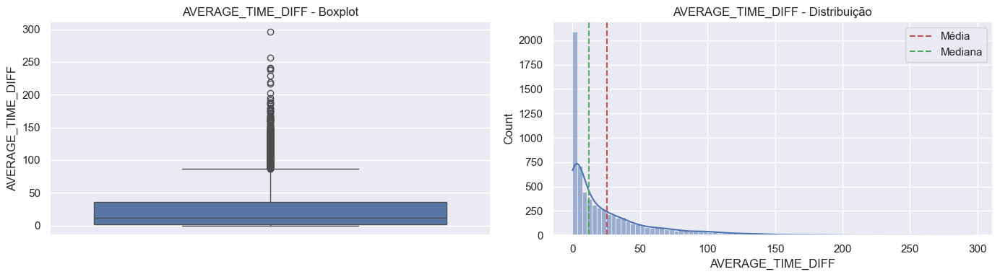

In [147]:
visualize_outliers(train_mode)

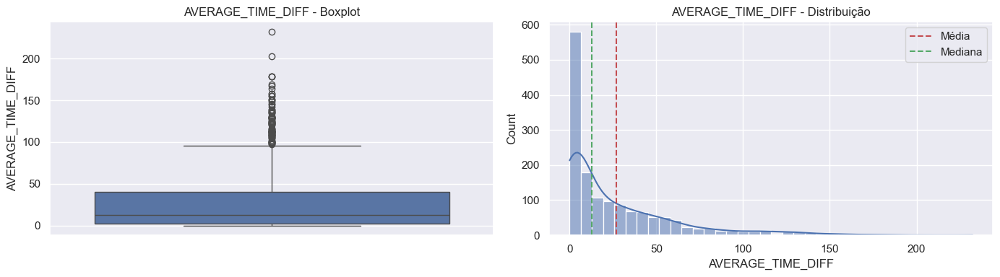

In [148]:
visualize_outliers(test_mode)

In [149]:
train_fixed, log = fix_impossible_values(train_mode)

🔧 Correção de Valores Impossíveis
   Range válido: [0, 143.4] min
   Valores inválidos: 69 (1.01%)

✅ Correção concluída!
   Total de valores corrigidos: 69

   Detalhes:
      • AVERAGE_TIME_DIFF: 69 valores


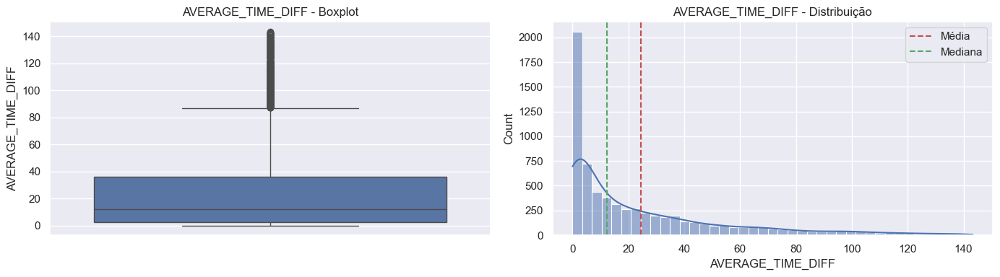

In [150]:
visualize_outliers(train_fixed)

In [151]:
test_fixed, log = fix_impossible_values(test_mode)

🔧 Correção de Valores Impossíveis
   Range válido: [0, 148.6] min
   Valores inválidos: 15 (1.00%)

✅ Correção concluída!
   Total de valores corrigidos: 15

   Detalhes:
      • AVERAGE_TIME_DIFF: 15 valores


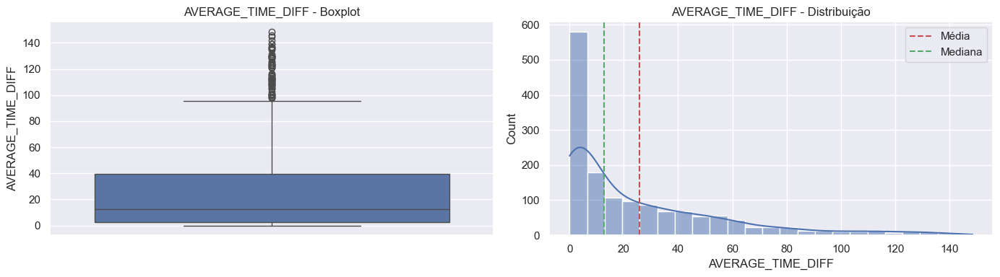

In [152]:
visualize_outliers(test_fixed)

#### Método 2 - Z-score

In [153]:
from scipy import stats

def detect_outliers_by_context(df, col, threshold=4):
    """
    Detecta outliers por contexto temporal (mês/hora).
    Usa Z-score por grupo.
    """
    df = df.copy()
    
    # Z-score por mês (sazonalidade)
    df['z_score'] = df.groupby('month')[col].transform(lambda x: np.abs(stats.zscore(x, nan_policy='omit')))
    
    # Outliers extremos (Z > 4 é ~99.99% da distribuição)
    outliers = df[df['z_score'] > threshold]
    
    print(f"🔍 Outliers em {col} (Z > {threshold}):")
    print(f"  Total: {len(outliers)} linhas ({100*len(outliers)/len(df):.2f}%)")
    
    if len(outliers) > 0:
        print(f"\n  Exemplos:")
        print(outliers[[col, 'month', 'hour', 'z_score']].head(10))
    
    return outliers

# Testar em variáveis suspeitas
outliers_time = detect_outliers_by_context(train_mode, 'AVERAGE_TIME_DIFF', threshold=4)
outliers_precip = detect_outliers_by_context(train_mode, 'AVERAGE_PRECIPITATION', threshold=4)

outliers_time.head()

🔍 Outliers em AVERAGE_TIME_DIFF (Z > 4):
  Total: 35 linhas (0.51%)

  Exemplos:
      AVERAGE_TIME_DIFF  month  hour   z_score
199               228.5     10     8  5.798847
228               165.0      2    17  4.188045
292               256.9      8    15  7.437471
1448              171.2      4    17  4.401250
1552              179.9      8    15  4.972644
1560              195.3      8    15  5.465610
1675              145.9      7    10  4.167875
1754              167.5      9    18  4.087089
2062              167.5     11     9  4.788790
2450              162.2      3    17  6.042427
🔍 Outliers em AVERAGE_PRECIPITATION (Z > 4):
  Total: 79 linhas (1.16%)

  Exemplos:
     AVERAGE_PRECIPITATION  month  hour    z_score
24                     3.9      8    18  15.695747
218                    0.4      7    11   4.809521
224                    3.2      1    13   4.471110
271                    1.8      2    10   5.966970
304                    2.3      9     7  11.817988
392        

,AVERAGE_SPEED_DIFF,AVERAGE_FREE_FLOW_SPEED,AVERAGE_TIME_DIFF,AVERAGE_FREE_FLOW_TIME,LUMINOSITY,AVERAGE_TEMPERATURE,AVERAGE_ATMOSP_PRESSURE,AVERAGE_HUMIDITY,AVERAGE_WIND_SPEED,AVERAGE_PRECIPITATION,...,weekday,target_num,AVERAGE_CLOUDINESS,year,month,day,IS_WEEKEND,IS_AUGUST,IS_HOLIDAY,z_score
199,4,44.9,228.5,84.6,2,9.0,1004.0,76.0,2.0,0.0,...,2,4.0,0.0,2018,10,10,0,0,0,5.798847
228,3,35.4,165.0,93.0,2,18.0,1020.0,51.0,2.0,0.0,...,5,3.0,0.0,2019,2,16,1,0,0,4.188045
292,3,38.2,256.9,89.1,2,22.0,1022.0,68.0,7.0,0.0,...,0,3.0,0.0,2019,8,12,0,1,0,7.437471
1448,3,38.0,171.2,88.5,2,18.0,1009.0,68.0,5.0,0.0,...,6,3.0,1.0,2019,4,21,1,0,1,4.401250
1552,3,39.6,179.9,87.4,2,24.0,1021.0,64.0,4.0,0.0,...,1,3.0,0.0,2019,8,13,0,1,0,4.972644


In [154]:
outliers_precip.head()

,AVERAGE_SPEED_DIFF,AVERAGE_FREE_FLOW_SPEED,AVERAGE_TIME_DIFF,AVERAGE_FREE_FLOW_TIME,LUMINOSITY,AVERAGE_TEMPERATURE,AVERAGE_ATMOSP_PRESSURE,AVERAGE_HUMIDITY,AVERAGE_WIND_SPEED,AVERAGE_PRECIPITATION,...,weekday,target_num,AVERAGE_CLOUDINESS,year,month,day,IS_WEEKEND,IS_AUGUST,IS_HOLIDAY,z_score
24,4,43.1,113.5,86.2,2,22.0,1011.0,94.0,7.0,3.9,...,3,4.0,0.0,2019,8,8,0,1,0,15.695747
218,3,36.3,60.8,94.0,2,22.0,1015.0,100.0,6.0,0.4,...,3,3.0,0.0,2019,7,25,0,0,0,4.809521
224,1,37.3,18.8,90.9,2,12.0,1011.0,100.0,2.0,3.2,...,5,1.0,0.0,2019,1,19,1,0,0,4.471110
271,4,42.9,59.2,87.1,2,9.0,993.0,81.0,8.0,1.8,...,4,4.0,0.0,2019,2,1,0,0,0,5.966970
304,4,44.8,101.5,77.2,1,17.0,1018.0,100.0,7.0,2.3,...,1,4.0,0.0,2019,9,24,0,0,0,11.817988


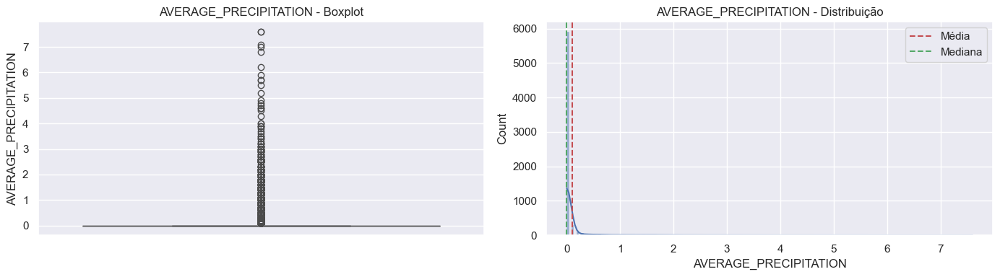

In [155]:
visualize_outliers(train_mode, col='AVERAGE_PRECIPITATION')

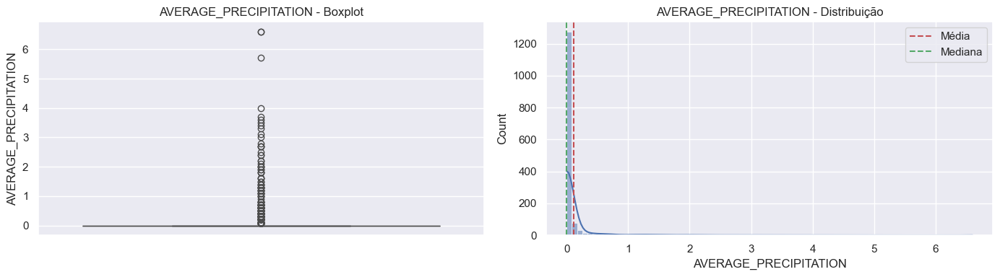

In [156]:
visualize_outliers(test_mode, col='AVERAGE_PRECIPITATION')

#### Método 3 - IQR (Interquartile Range)

In [157]:
def detect_outliers_iqr(df, col, multiplier=5):
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    
    lower_bound = Q1 - multiplier * IQR
    upper_bound = Q3 + multiplier * IQR
    
    outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
    
    print(f"🔍 Outliers IQR em {col} (multiplier={multiplier}):")
    print(f"  Range normal: [{lower_bound:.2f}, {upper_bound:.2f}]")
    print(f"  Outliers: {len(outliers)} linhas ({100*len(outliers)/len(df):.2f}%)")
    
    return outliers, lower_bound, upper_bound

In [158]:
outliers, lower, upper = detect_outliers_iqr(train_mode, 'AVERAGE_TIME_DIFF')

🔍 Outliers IQR em AVERAGE_TIME_DIFF (multiplier=5):
  Range normal: [-167.35, 205.83]
  Outliers: 8 linhas (0.12%)


In [159]:
outliers, lower, upper = detect_outliers_iqr(train_mode, 'AVERAGE_PRECIPITATION')

🔍 Outliers IQR em AVERAGE_PRECIPITATION (multiplier=5):
  Range normal: [0.00, 0.00]
  Outliers: 911 linhas (13.37%)


In [160]:
outliers, lower, upper = detect_outliers_iqr(test_mode, 'AVERAGE_TIME_DIFF')

🔍 Outliers IQR em AVERAGE_TIME_DIFF (multiplier=5):
  Range normal: [-186.12, 228.85]
  Outliers: 1 linhas (0.07%)


In [161]:
outliers, lower, upper = detect_outliers_iqr(test_mode, 'AVERAGE_PRECIPITATION')

🔍 Outliers IQR em AVERAGE_PRECIPITATION (multiplier=5):
  Range normal: [0.00, 0.00]
  Outliers: 227 linhas (15.13%)


##### Apesar de haver valores extremamente elevados para a altura do ano (como podemos ver pelo z-score) e globalmente (como podemos ver no gráfico), decidimos não alterar nenhum valor porque apesar de altos comparado uns com os outros eles são possíveis e também porque foram retirados de uma fonte externa confiável

## Normalização

### Normalização das variáveis com escalas maiores

In [162]:
train_v9 = train_mode.copy()
test_v9 = test_mode.copy()

print("Variáveis 'train_v9' e 'test_v9' criadas a partir do V8 (train_mode).")
print(f"Dimensões: Treino {train_v9.shape} | Teste {test_v9.shape}")

Variáveis 'train_v9' e 'test_v9' criadas a partir do V8 (train_mode).
Dimensões: Treino (6812, 20) | Teste (1500, 18)


In [163]:
# 2. Lista das features para normalizar
cols_to_scale = [
    'AVERAGE_TEMPERATURE', 
    'AVERAGE_ATMOSP_PRESSURE', 
    'AVERAGE_HUMIDITY', 
    'AVERAGE_WIND_SPEED', 
    'AVERAGE_PRECIPITATION',
    'AVERAGE_FREE_FLOW_SPEED',
    'AVERAGE_TIME_DIFF',
    'AVERAGE_FREE_FLOW_TIME'
]

# Verificar se todas existem no dataset 
cols_present = [c for c in cols_to_scale if c in train_v9.columns]

print(f"Colunas identificadas para normalização:")
for c in cols_present:
    print(f" - {c}")

Colunas identificadas para normalização:
 - AVERAGE_TEMPERATURE
 - AVERAGE_ATMOSP_PRESSURE
 - AVERAGE_HUMIDITY
 - AVERAGE_WIND_SPEED
 - AVERAGE_PRECIPITATION
 - AVERAGE_FREE_FLOW_SPEED
 - AVERAGE_TIME_DIFF
 - AVERAGE_FREE_FLOW_TIME


In [164]:
from sklearn.preprocessing import MinMaxScaler

# 3. Inicializar e Aplicar o Scaler (0 a 1)
scaler = MinMaxScaler(feature_range=(0, 1))

# Fit e Transform no TREINO (Aprende a escala e aplica)
train_v9[cols_present] = scaler.fit_transform(train_v9[cols_present])

# Apenas Transform no TESTE (Usa a escala do treino - evita data leakage)
if len(cols_present) > 0:
    test_v9[cols_present] = scaler.transform(test_v9[cols_present])

print("Normalização aplicada")

Normalização aplicada


In [165]:
train_v9.to_csv('./Dataset/training_data_v9.csv', index=False)
test_v9.to_csv('./Dataset/test_data_v9.csv', index=False)

train_v9.head()

,AVERAGE_SPEED_DIFF,AVERAGE_FREE_FLOW_SPEED,AVERAGE_TIME_DIFF,AVERAGE_FREE_FLOW_TIME,LUMINOSITY,AVERAGE_TEMPERATURE,AVERAGE_ATMOSP_PRESSURE,AVERAGE_HUMIDITY,AVERAGE_WIND_SPEED,AVERAGE_PRECIPITATION,hour,weekday,target_num,AVERAGE_CLOUDINESS,year,month,day,IS_WEEKEND,IS_AUGUST,IS_HOLIDAY
0,2,0.433071,0.038786,0.381098,2,0.428571,0.708333,1.000000,0.214286,0.000000,7,3,2.0,0.0,2019,8,29,0,1,0
1,3,0.440945,0.162901,0.625000,2,0.600000,0.750000,0.453488,0.357143,0.000000,14,4,3.0,0.0,2018,8,10,0,1,0
2,3,0.318898,0.129511,0.591463,2,0.742857,0.604167,0.546512,0.285714,0.000000,16,6,3.0,0.0,2019,9,1,1,0,0
3,3,0.271654,0.205734,0.727134,2,0.514286,0.833333,0.395349,0.285714,0.000000,11,1,3.0,0.0,2019,2,26,0,0,0
4,2,0.437008,0.169983,0.466463,2,0.428571,0.479167,0.790698,0.714286,0.052632,12,3,2.0,0.0,2019,6,6,0,0,0


In [166]:
test_v9.head()

,AVERAGE_FREE_FLOW_SPEED,AVERAGE_TIME_DIFF,AVERAGE_FREE_FLOW_TIME,LUMINOSITY,AVERAGE_TEMPERATURE,AVERAGE_ATMOSP_PRESSURE,AVERAGE_HUMIDITY,AVERAGE_WIND_SPEED,AVERAGE_PRECIPITATION,AVERAGE_CLOUDINESS,year,month,day,hour,weekday,IS_WEEKEND,IS_AUGUST,IS_HOLIDAY
0,0.342520,0.000000,0.679878,0,0.228571,0.854167,0.662791,0.071429,0.000000,0.0,2019,2,13,23,2,0,0,0
1,0.472441,0.041147,0.463415,0,0.314286,0.729167,0.918605,0.285714,0.000000,1.0,2018,11,28,20,2,0,0,0
2,0.606299,0.000000,0.608232,0,0.400000,0.666667,0.918605,0.000000,0.000000,0.0,2018,8,14,5,1,0,1,0
3,0.106299,0.174368,0.663110,2,0.628571,0.645833,0.732558,0.285714,0.000000,1.0,2019,7,6,17,5,1,0,0
4,0.531496,0.011804,0.596037,0,0.342857,0.395833,1.000000,0.642857,0.315789,0.0,2018,10,15,6,0,0,0,0


### Normalização das datas com cyclic encoding

In [167]:
train_v10 = train_v9.copy()
test_v10 = test_v9.copy()

In [168]:
def cyclicalEncoding(df, drop_date=True, inplace=False):
    # ========================================
    # ENCODING CÍCLICO (para capturar periodicidade)
    # ========================================
    # Hora (24h -> ciclo)
    df['hour_sin'] = np.sin(2 * np.pi * df['hour'] / 24)
    df['hour_cos'] = np.cos(2 * np.pi * df['hour'] / 24)
    
    # Dia da semana (7 dias -> ciclo)
    df['weekday_sin'] = np.sin(2 * np.pi * df['weekday'] / 7)
    df['weekday_cos'] = np.cos(2 * np.pi * df['weekday'] / 7)

    return df

In [169]:
train_v10 = cyclicalEncoding(train_v10)
test_v10 = cyclicalEncoding(test_v10)

train_v10.drop(['hour', 'weekday'], axis= 1, inplace=True)
test_v10.drop(['hour', 'weekday'], axis=1, inplace=True)

In [170]:
train_v10.to_csv('./Dataset/training_data_v10.csv', index=False)
test_v10.to_csv('./Dataset/test_data_v10.csv', index=False)

train_v10.head()

,AVERAGE_SPEED_DIFF,AVERAGE_FREE_FLOW_SPEED,AVERAGE_TIME_DIFF,AVERAGE_FREE_FLOW_TIME,LUMINOSITY,AVERAGE_TEMPERATURE,AVERAGE_ATMOSP_PRESSURE,AVERAGE_HUMIDITY,AVERAGE_WIND_SPEED,AVERAGE_PRECIPITATION,...,year,month,day,IS_WEEKEND,IS_AUGUST,IS_HOLIDAY,hour_sin,hour_cos,weekday_sin,weekday_cos
0,2,0.433071,0.038786,0.381098,2,0.428571,0.708333,1.000000,0.214286,0.000000,...,2019,8,29,0,1,0,9.659258e-01,-0.258819,0.433884,-0.900969
1,3,0.440945,0.162901,0.625000,2,0.600000,0.750000,0.453488,0.357143,0.000000,...,2018,8,10,0,1,0,-5.000000e-01,-0.866025,-0.433884,-0.900969
2,3,0.318898,0.129511,0.591463,2,0.742857,0.604167,0.546512,0.285714,0.000000,...,2019,9,1,1,0,0,-8.660254e-01,-0.500000,-0.781831,0.623490
3,3,0.271654,0.205734,0.727134,2,0.514286,0.833333,0.395349,0.285714,0.000000,...,2019,2,26,0,0,0,2.588190e-01,-0.965926,0.781831,0.623490
4,2,0.437008,0.169983,0.466463,2,0.428571,0.479167,0.790698,0.714286,0.052632,...,2019,6,6,0,0,0,1.224647e-16,-1.000000,0.433884,-0.900969


In [171]:
test_v10.head()

,AVERAGE_FREE_FLOW_SPEED,AVERAGE_TIME_DIFF,AVERAGE_FREE_FLOW_TIME,LUMINOSITY,AVERAGE_TEMPERATURE,AVERAGE_ATMOSP_PRESSURE,AVERAGE_HUMIDITY,AVERAGE_WIND_SPEED,AVERAGE_PRECIPITATION,AVERAGE_CLOUDINESS,year,month,day,IS_WEEKEND,IS_AUGUST,IS_HOLIDAY,hour_sin,hour_cos,weekday_sin,weekday_cos
0,0.342520,0.000000,0.679878,0,0.228571,0.854167,0.662791,0.071429,0.000000,0.0,2019,2,13,0,0,0,-0.258819,9.659258e-01,0.974928,-0.222521
1,0.472441,0.041147,0.463415,0,0.314286,0.729167,0.918605,0.285714,0.000000,1.0,2018,11,28,0,0,0,-0.866025,5.000000e-01,0.974928,-0.222521
2,0.606299,0.000000,0.608232,0,0.400000,0.666667,0.918605,0.000000,0.000000,0.0,2018,8,14,0,1,0,0.965926,2.588190e-01,0.781831,0.623490
3,0.106299,0.174368,0.663110,2,0.628571,0.645833,0.732558,0.285714,0.000000,1.0,2019,7,6,1,0,0,-0.965926,-2.588190e-01,-0.974928,-0.222521
4,0.531496,0.011804,0.596037,0,0.342857,0.395833,1.000000,0.642857,0.315789,0.0,2018,10,15,0,0,0,1.000000,6.123234e-17,0.000000,1.000000


## Análise das features e feature selection

##### AVERAGE_SPEED_DIFF vs AVERAGE_TIME_DIFF tem os pontos mais escuros (trânsito baixo) em baixo e os mais claros (trânsito alto) em cima, isso confirma visualmente que esta variável consegue separar as classes sozinha.

##### Já a coluna da AVERAGE_CLOUDINESS ou AVERAGE_HUMIDITY tem as cores (classes 0 a 4) completamente sobrepostas umas nas outras, o que confirma que o modelo vai ter muita dificuldade em distinguir "High Traffic" de "Low Traffic" usando-as, ou seja, são variáveis fracas.

##### Nos circulos da hour_cos e hour_sin vê-se claramente que há certas horas (topo e fundo da curva) onde certas cores (classes de trânsito) aparecem mais. Isso valida o uso da hora como feature.

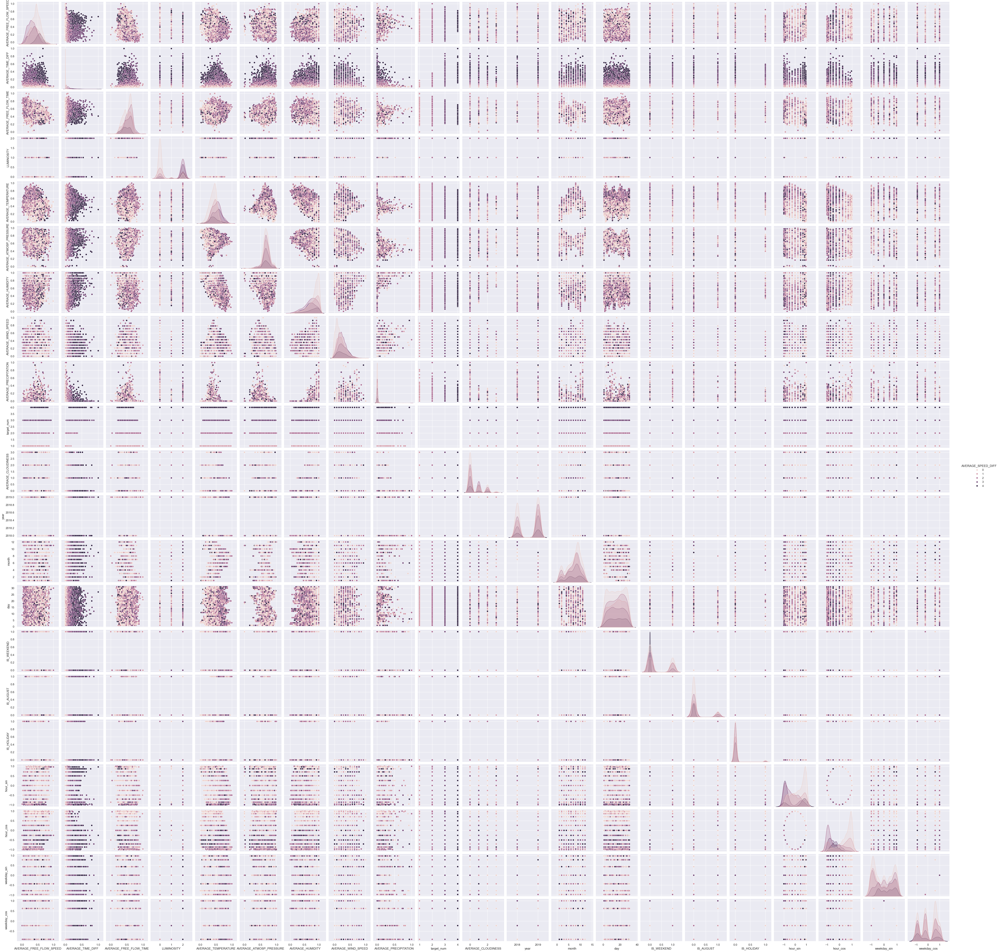

In [172]:
sns.pairplot(train_v10, hue='AVERAGE_SPEED_DIFF')

##### AVERAGE_SPEED_DIFF (target) e AVERAGE_TIME_DIFF estão extremamente correlacionados, logo esta é a tua variável mais importante

##### LUMINOSITY vs. hour_cos também estão extremamente correlacionados. Como LUMINOSITY tem uma correlação maior com o target (0.6) do que o hour_cos (-0.55), a luminosidade parece ser um preditor ligeiramente melhor, talvez porque capta dias muito escuros de chuva que a hora pura não capta.

<Axes: >

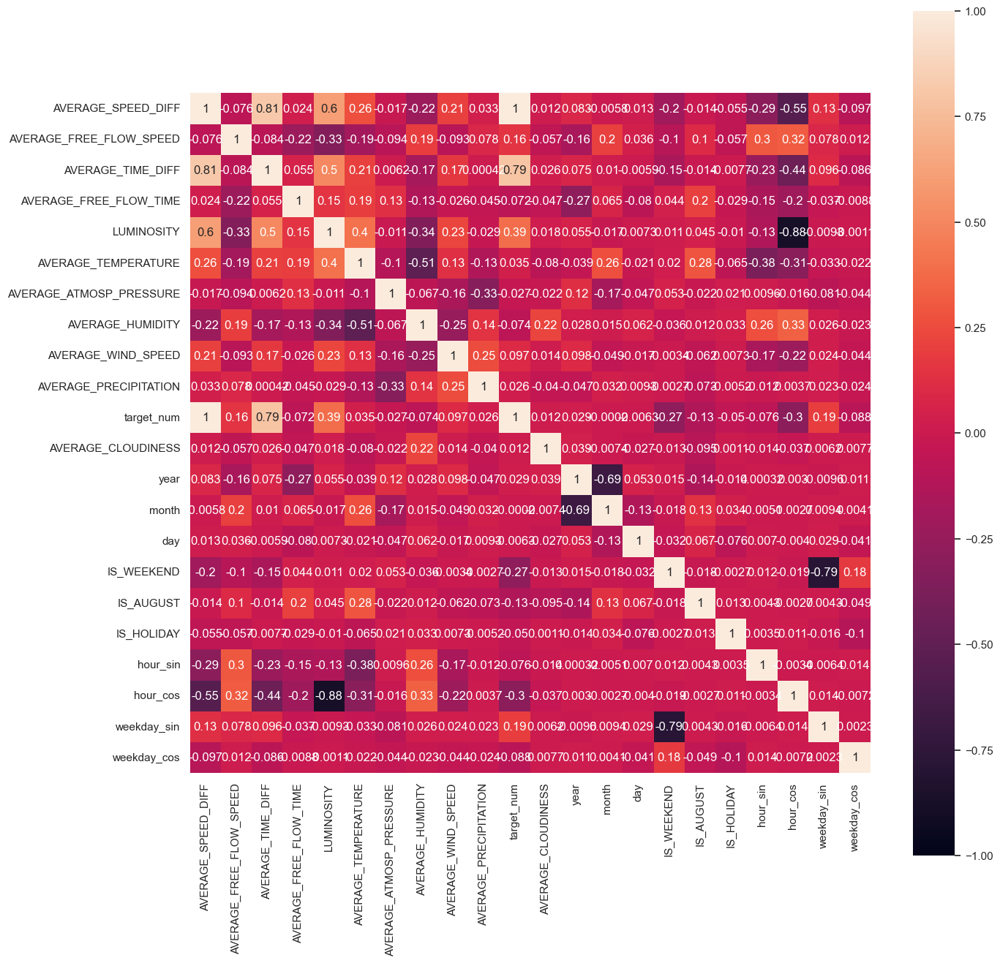

In [173]:
corr_matrix = train_v10.corr()
f, ax = plt.subplots(figsize=(15, 15))
sns.heatmap(corr_matrix, vmin=-1, vmax=1, square=True, annot=True)

In [174]:
correlation_with_target = corr_matrix['AVERAGE_SPEED_DIFF'].sort_values(ascending=False)
print("Correlation with target (AVERAGE_SPEED_DIFF): \n", correlation_with_target)

Correlation with target (AVERAGE_SPEED_DIFF): 
 AVERAGE_SPEED_DIFF         1.000000
target_num                 1.000000
AVERAGE_TIME_DIFF          0.814728
LUMINOSITY                 0.602164
AVERAGE_TEMPERATURE        0.258776
AVERAGE_WIND_SPEED         0.209477
weekday_sin                0.127497
year                       0.083235
AVERAGE_PRECIPITATION      0.032782
AVERAGE_FREE_FLOW_TIME     0.024276
day                        0.013075
AVERAGE_CLOUDINESS         0.012479
month                     -0.005785
IS_AUGUST                 -0.014322
AVERAGE_ATMOSP_PRESSURE   -0.016710
IS_HOLIDAY                -0.054934
AVERAGE_FREE_FLOW_SPEED   -0.076346
weekday_cos               -0.097332
IS_WEEKEND                -0.197382
AVERAGE_HUMIDITY          -0.224832
hour_sin                  -0.293681
hour_cos                  -0.552279
Name: AVERAGE_SPEED_DIFF, dtype: float64


In [175]:
correlation_with_target = corr_matrix['AVERAGE_TIME_DIFF'].sort_values(ascending=False)
print("Correlation with target (AAVERAGE_TIME_DIFF): \n", correlation_with_target)

Correlation with target (AAVERAGE_TIME_DIFF): 
 AVERAGE_TIME_DIFF          1.000000
AVERAGE_SPEED_DIFF         0.814728
target_num                 0.789424
LUMINOSITY                 0.504383
AVERAGE_TEMPERATURE        0.205935
AVERAGE_WIND_SPEED         0.169855
weekday_sin                0.095521
year                       0.074928
AVERAGE_FREE_FLOW_TIME     0.055194
AVERAGE_CLOUDINESS         0.025705
month                      0.010306
AVERAGE_ATMOSP_PRESSURE    0.006243
AVERAGE_PRECIPITATION      0.000419
day                       -0.005876
IS_HOLIDAY                -0.007692
IS_AUGUST                 -0.013930
AVERAGE_FREE_FLOW_SPEED   -0.083653
weekday_cos               -0.085738
IS_WEEKEND                -0.151971
AVERAGE_HUMIDITY          -0.173598
hour_sin                  -0.228673
hour_cos                  -0.443592
Name: AVERAGE_TIME_DIFF, dtype: float64


Skewness AVERAGE_FREE_FLOW_SPEED: 0.10973130090136779
Kurtosis AVERAGE_FREE_FLOW_SPEED: -0.32436675582163454
Skewness AVERAGE_TIME_DIFF: 2.0422071795699375
Kurtosis AVERAGE_TIME_DIFF: 5.111165221965141
Skewness AVERAGE_FREE_FLOW_TIME: -0.3657608786050381
Kurtosis AVERAGE_FREE_FLOW_TIME: -0.20963522546324276
Skewness AVERAGE_TEMPERATURE: 0.1818328123210941
Kurtosis AVERAGE_TEMPERATURE: 0.2865185046306129


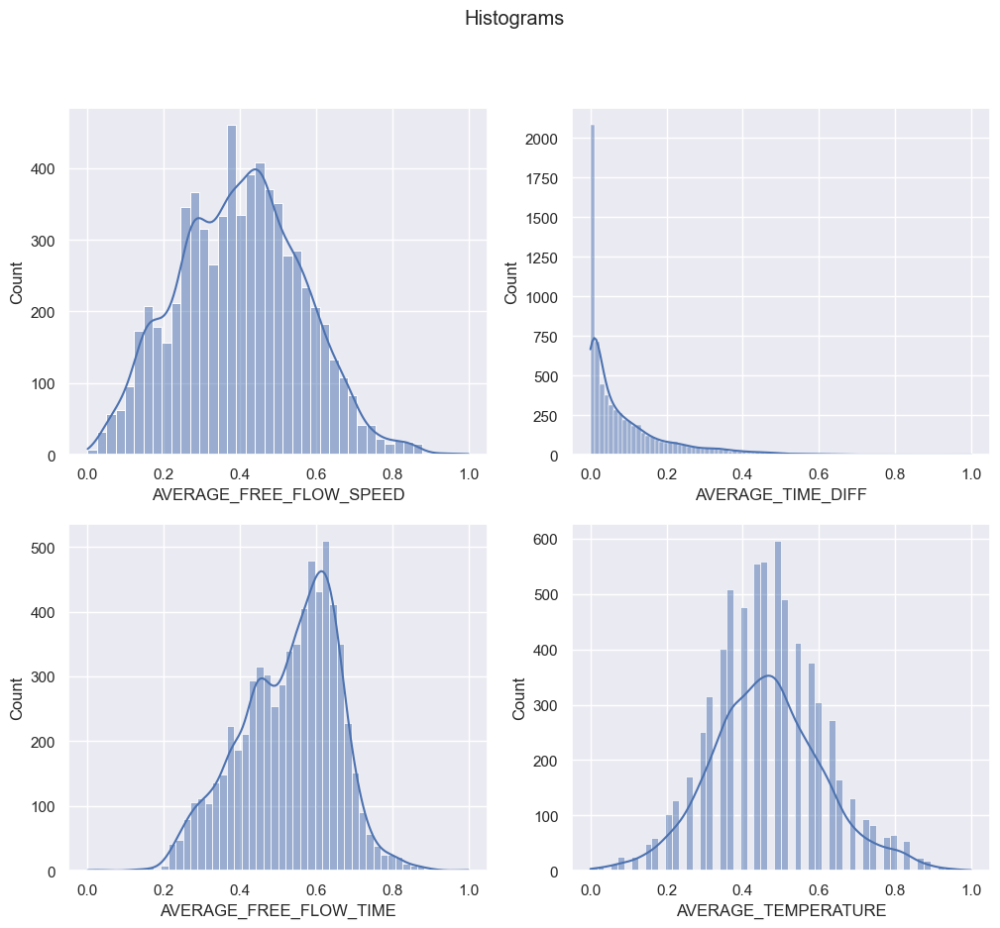

In [176]:
fig, axs = plt.subplots(2, 2, figsize=(12, 10))
fig.suptitle('Histograms')

sns.histplot(train_v10['AVERAGE_FREE_FLOW_SPEED'], ax=axs[0, 0], kde=True)
sns.histplot(train_v10['AVERAGE_TIME_DIFF'], ax=axs[0, 1], kde=True)
sns.histplot(train_v10['AVERAGE_FREE_FLOW_TIME'], ax=axs[1, 0], kde=True)
sns.histplot(train_v10['AVERAGE_TEMPERATURE'], ax=axs[1, 1], kde=True)

print(f"Skewness AVERAGE_FREE_FLOW_SPEED: {train_v10['AVERAGE_FREE_FLOW_SPEED'].skew()}")
print(f"Kurtosis AVERAGE_FREE_FLOW_SPEED: {train_v10['AVERAGE_FREE_FLOW_SPEED'].kurt()}")
print(f"Skewness AVERAGE_TIME_DIFF: {train_v10['AVERAGE_TIME_DIFF'].skew()}")
print(f"Kurtosis AVERAGE_TIME_DIFF: {train_v10['AVERAGE_TIME_DIFF'].kurt()}")
print(f"Skewness AVERAGE_FREE_FLOW_TIME: {train_v10['AVERAGE_FREE_FLOW_TIME'].skew()}")
print(f"Kurtosis AVERAGE_FREE_FLOW_TIME: {train_v10['AVERAGE_FREE_FLOW_TIME'].kurt()}")
print(f"Skewness AVERAGE_TEMPERATURE: {train_v10['AVERAGE_TEMPERATURE'].skew()}")
print(f"Kurtosis AVERAGE_TEMPERATURE: {train_v10['AVERAGE_TEMPERATURE'].kurt()}")


Skewness AVERAGE_ATMOSP_PRESSURE: -0.8233601395441351
Kurtosis AVERAGE_ATMOSP_PRESSURE: 3.5052262540752666
Skewness AVERAGE_HUMIDITY: -0.965999920020643
Kurtosis AVERAGE_HUMIDITY: 0.3497493709599926
Skewness AVERAGE_WIND_SPEED: 0.8734786776888476
Kurtosis AVERAGE_WIND_SPEED: 0.8870753085026739
Skewness AVERAGE_PRECIPITATION: 7.626413931286454
Kurtosis AVERAGE_PRECIPITATION: 76.27098065492142


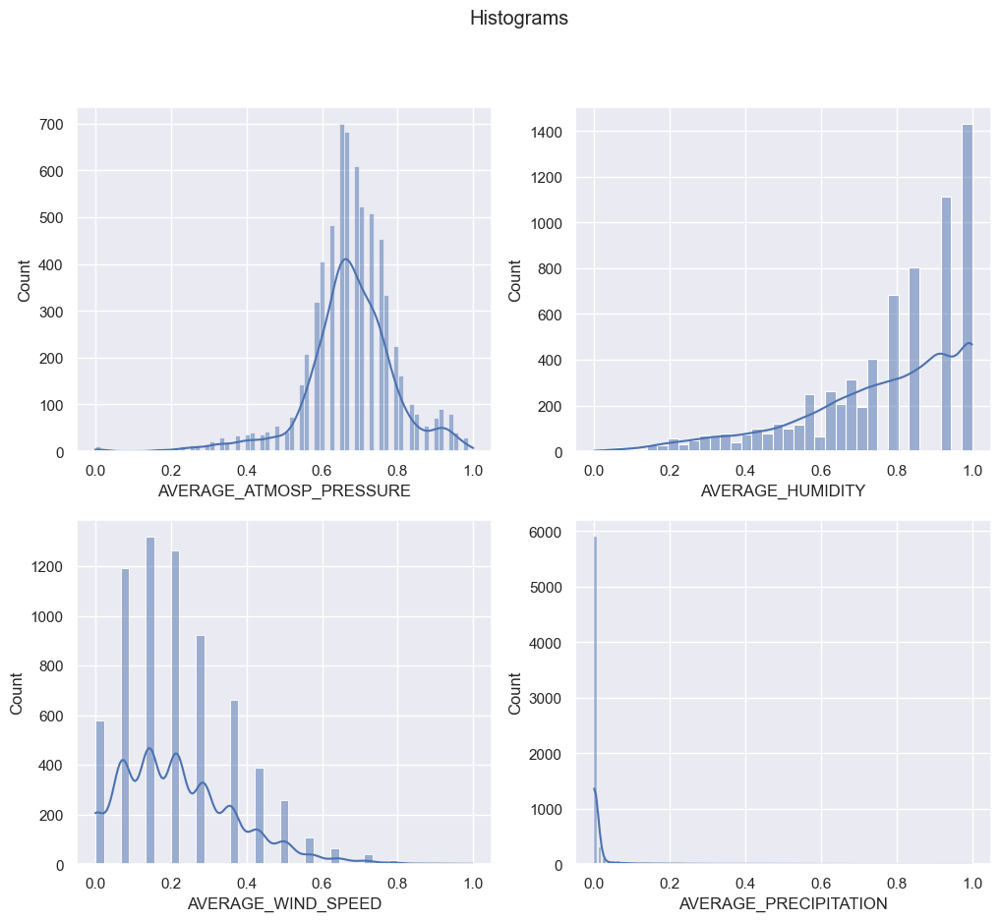

In [177]:
fig, axs = plt.subplots(2, 2, figsize=(12, 10))
fig.suptitle('Histograms')

sns.histplot(train_v10['AVERAGE_ATMOSP_PRESSURE'], ax=axs[0, 0], kde=True)
sns.histplot(train_v10['AVERAGE_HUMIDITY'], ax=axs[0, 1], kde=True)
sns.histplot(train_v10['AVERAGE_WIND_SPEED'], ax=axs[1, 0], kde=True)
sns.histplot(train_v10['AVERAGE_PRECIPITATION'], ax=axs[1, 1], kde=True)

print(f"Skewness AVERAGE_ATMOSP_PRESSURE: {train_v10['AVERAGE_ATMOSP_PRESSURE'].skew()}")
print(f"Kurtosis AVERAGE_ATMOSP_PRESSURE: {train_v10['AVERAGE_ATMOSP_PRESSURE'].kurt()}")
print(f"Skewness AVERAGE_HUMIDITY: {train_v10['AVERAGE_HUMIDITY'].skew()}")
print(f"Kurtosis AVERAGE_HUMIDITY: {train_v10['AVERAGE_HUMIDITY'].kurt()}")
print(f"Skewness AVERAGE_WIND_SPEED: {train_v10['AVERAGE_WIND_SPEED'].skew()}")
print(f"Kurtosis AVERAGE_WIND_SPEED: {train_v10['AVERAGE_WIND_SPEED'].kurt()}")
print(f"Skewness AVERAGE_PRECIPITATION: {train_v10['AVERAGE_PRECIPITATION'].skew()}")
print(f"Kurtosis AVERAGE_PRECIPITATION: {train_v10['AVERAGE_PRECIPITATION'].kurt()}")

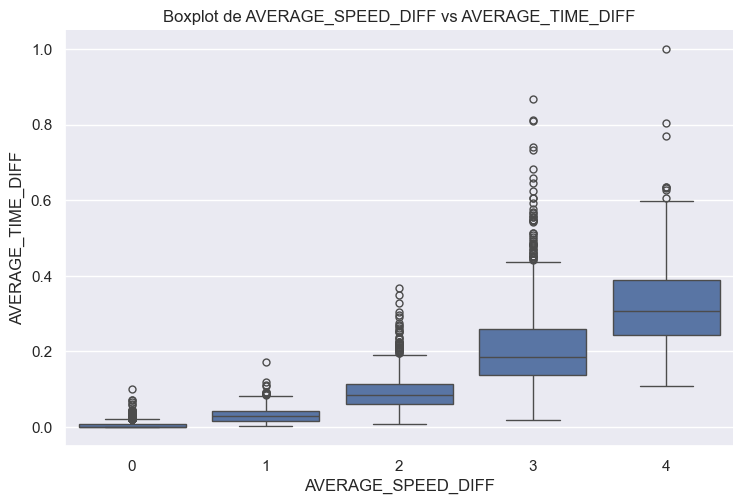

In [178]:
sns.catplot(x="AVERAGE_SPEED_DIFF", y="AVERAGE_TIME_DIFF", data=train_v10, kind="box", aspect=1.5)
plt.title("Boxplot de AVERAGE_SPEED_DIFF vs AVERAGE_TIME_DIFF")
plt.show()

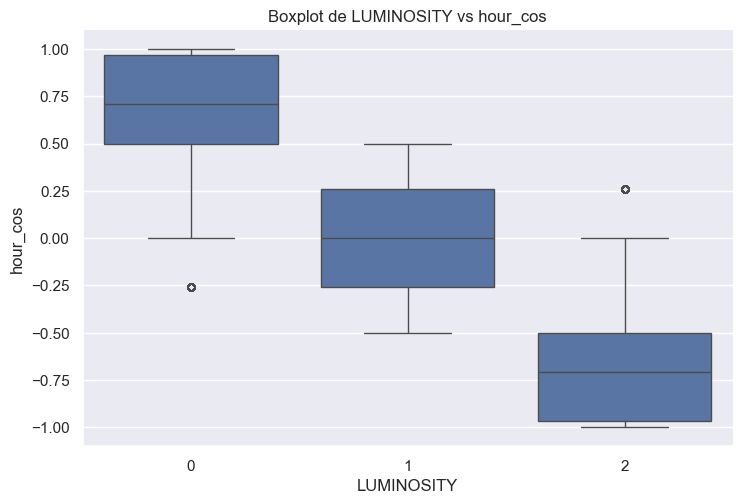

In [179]:
sns.catplot(x="LUMINOSITY", y="hour_cos", data=train_v10, kind="box", aspect=1.5)
plt.title("Boxplot de LUMINOSITY vs hour_cos")
plt.show()

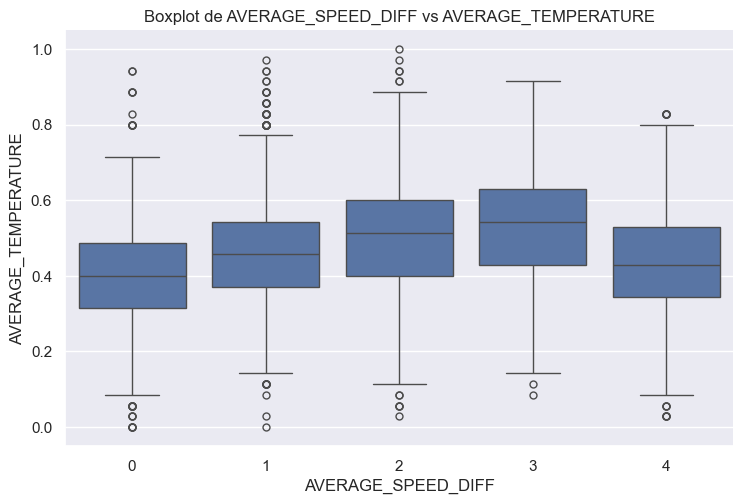

In [180]:
sns.catplot(x="AVERAGE_SPEED_DIFF", y="AVERAGE_TEMPERATURE", data=train_v10, kind="box", aspect=1.5)
plt.title("Boxplot de AVERAGE_SPEED_DIFF vs AVERAGE_TEMPERATURE")
plt.show()

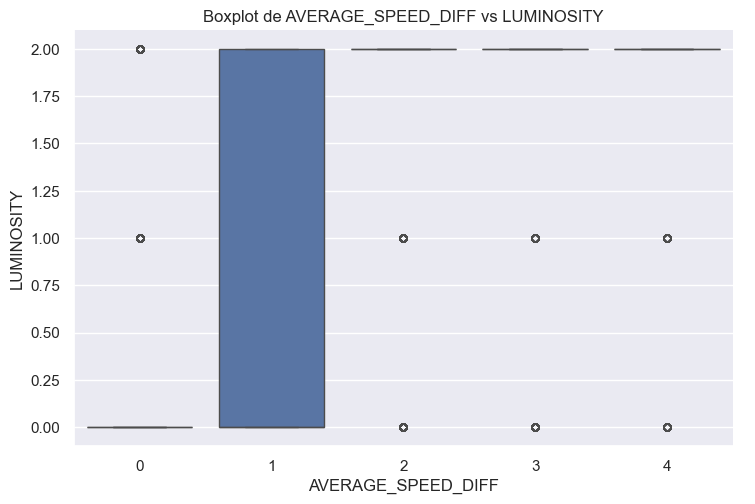

In [181]:
sns.catplot(x="AVERAGE_SPEED_DIFF", y="LUMINOSITY", data=train_v10, kind="box", aspect=1.5)
plt.title("Boxplot de AVERAGE_SPEED_DIFF vs LUMINOSITY")
plt.show()

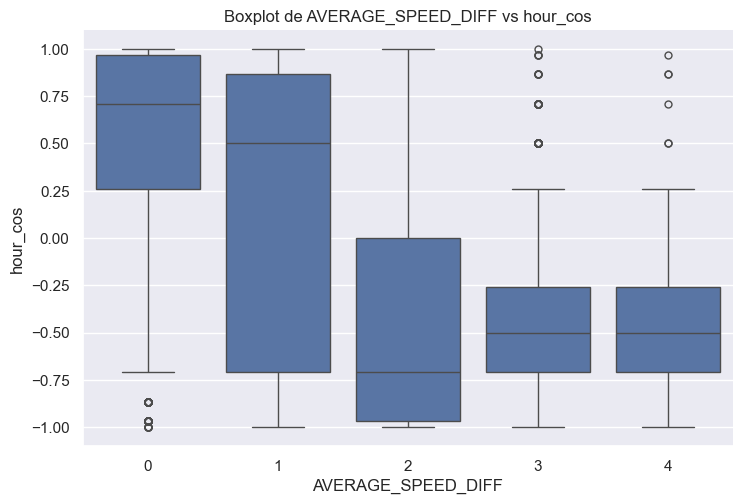

In [182]:
sns.catplot(x="AVERAGE_SPEED_DIFF", y="hour_cos", data=train_v10, kind="box", aspect=1.5)
plt.title("Boxplot de AVERAGE_SPEED_DIFF vs hour_cos")
plt.show()

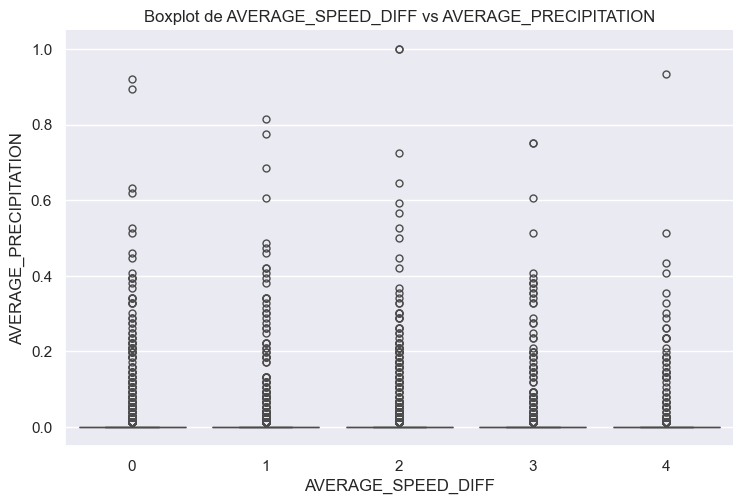

In [183]:
sns.catplot(x="AVERAGE_SPEED_DIFF", y="AVERAGE_PRECIPITATION", data=train_v10, kind="box", aspect=1.5)
plt.title("Boxplot de AVERAGE_SPEED_DIFF vs AVERAGE_PRECIPITATION")
plt.show()

<Axes: xlabel='AVERAGE_SPEED_DIFF', ylabel='AVERAGE_TIME_DIFF'>

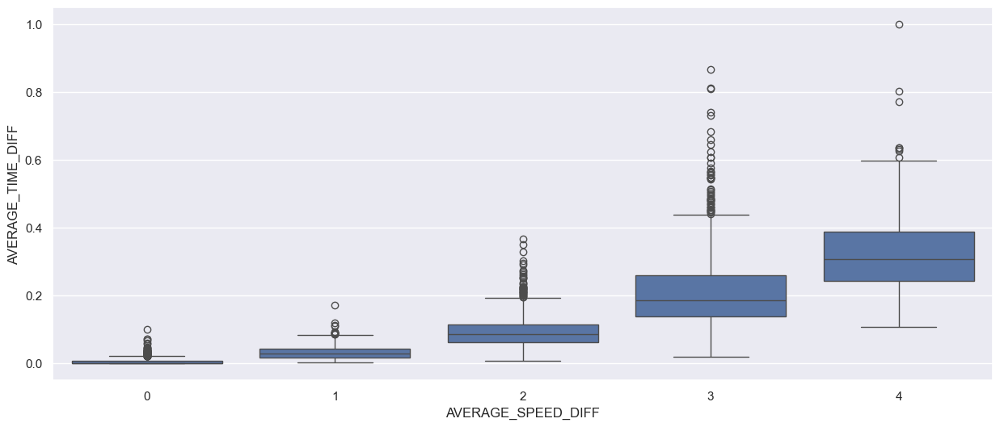

In [184]:
_, ax = plt.subplots(figsize=(15, 6))
fig.suptitle("Boxplot for AVERAGE_SPEED_DIFF vs AVERAGE_TIME_DIFF")
sns.boxplot(x=train_v10["AVERAGE_SPEED_DIFF"], y=train_v10["AVERAGE_TIME_DIFF"])

In [185]:
# train_v11 = train_v10.drop(['AVERAGE_ATMOSP_PRESSURE', 'AVERAGE_PRECIPITATION', 'AVERAGE_CLOUDINESS', 'year', 'month', 'day', 'IS_AUGUST', 'IS_HOLIDAY'], axis= 1, inplace= False)
# test_v11 = test_v10.drop(['AVERAGE_ATMOSP_PRESSURE', 'AVERAGE_PRECIPITATION', 'AVERAGE_CLOUDINESS', 'year', 'month', 'day', 'IS_AUGUST', 'IS_HOLIDAY'], axis= 1, inplace= False)

In [186]:
train_v11 = train_v10.drop(['month'], axis= 1, inplace= False)
test_v11 = test_v10.drop(['month'], axis= 1, inplace= False)

In [187]:
train_v11.head()

,AVERAGE_SPEED_DIFF,AVERAGE_FREE_FLOW_SPEED,AVERAGE_TIME_DIFF,AVERAGE_FREE_FLOW_TIME,LUMINOSITY,AVERAGE_TEMPERATURE,AVERAGE_ATMOSP_PRESSURE,AVERAGE_HUMIDITY,AVERAGE_WIND_SPEED,AVERAGE_PRECIPITATION,...,AVERAGE_CLOUDINESS,year,day,IS_WEEKEND,IS_AUGUST,IS_HOLIDAY,hour_sin,hour_cos,weekday_sin,weekday_cos
0,2,0.433071,0.038786,0.381098,2,0.428571,0.708333,1.000000,0.214286,0.000000,...,0.0,2019,29,0,1,0,9.659258e-01,-0.258819,0.433884,-0.900969
1,3,0.440945,0.162901,0.625000,2,0.600000,0.750000,0.453488,0.357143,0.000000,...,0.0,2018,10,0,1,0,-5.000000e-01,-0.866025,-0.433884,-0.900969
2,3,0.318898,0.129511,0.591463,2,0.742857,0.604167,0.546512,0.285714,0.000000,...,0.0,2019,1,1,0,0,-8.660254e-01,-0.500000,-0.781831,0.623490
3,3,0.271654,0.205734,0.727134,2,0.514286,0.833333,0.395349,0.285714,0.000000,...,0.0,2019,26,0,0,0,2.588190e-01,-0.965926,0.781831,0.623490
4,2,0.437008,0.169983,0.466463,2,0.428571,0.479167,0.790698,0.714286,0.052632,...,0.0,2019,6,0,0,0,1.224647e-16,-1.000000,0.433884,-0.900969


In [188]:
train_v11.to_csv('./Dataset/training_data_v11.csv', index=False)
test_v11.to_csv('./Dataset/test_data_v11.csv', index=False)

In [189]:
def engineer_features(df):
    df = df.copy()

    denom = df['AVERAGE_FREE_FLOW_TIME']
    num = df['AVERAGE_TIME_DIFF']
    
    df['Congestion_Factor'] = np.where(denom == 0, 0, num / denom)

    df['AVERAGE_TIME_DIFF_x_HOUR'] = df['AVERAGE_TIME_DIFF'] * df['hour_cos']

    #df['AVERAGE_TIME_DIFF_CAT'] = pd.qcut(df['AVERAGE_TIME_DIFF'], q=10, labels=False, duplicates='drop')

    df['AVERAGE_TIME_DIFF_SQR'] = df['AVERAGE_TIME_DIFF'] ** 2

    return df

In [190]:
train_v12 = engineer_features(train_v11)
test_v12 = engineer_features(test_v11)

train_v12[['Congestion_Factor', 'AVERAGE_TIME_DIFF_x_HOUR', 'AVERAGE_TIME_DIFF_SQR']].head()

,Congestion_Factor,AVERAGE_TIME_DIFF_x_HOUR,AVERAGE_TIME_DIFF_SQR
0,0.101774,-0.010039,0.001504
1,0.260641,-0.141076,0.026537
2,0.218967,-0.064755,0.016773
3,0.282938,-0.198723,0.042326
4,0.364408,-0.169983,0.028894


In [191]:
train_v12.to_csv('./Dataset/training_data_v12.csv', index=False)
test_v12.to_csv('./Dataset/test_data_v12.csv', index=False)